# process spectra for AuxTel with new spectractor (version=2.5, July 2023, branch  run auxtel september 2023) in any mode (postisrccd and flatfielded)

- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNRS, DESC-LSST fullmember, behalf AuxTel Teal VERA C. Rubin observatory
- creation date : September 21 2023
- update : 2023-09-21

- version v8 : Work with extr

This notebook is to help for finding the position of order 0



# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
! eups list -s | grep LOCAL

analysis_tools        LOCAL:/home/d/dagoret/repos/repos_w_2023_35/analysis_tools 	setup
atmospec              LOCAL:/home/d/dagoret/repos/repos_w_2023_35/atmospec 	setup
eups                  LOCAL:/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-7.0.1/eups 	setup
spectractor           LOCAL:/home/d/dagoret/repos/repos_w_2023_35/Spectractor 	setup


In [3]:
import sys
print(sys.path)

['/sdf/data/rubin/user/dagoret/AuxTel_summit_tests_2023/runspectractor_standalone/2023_09', '/home/d/dagoret/repos/repos_w_2023_35/analysis_tools/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/cp_pipe/g857a3418e4+7df23b908a/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/shapelet/g44018dc512+ea6441928c/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/meas_modelfit/g93c4d6e787+79b822255a/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/scarlet_extensions/g9d18589735+d445b4966c/lib/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/proxmin/g33b4157f25/lib/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/scarlet/g63ff1f842d+4083830bf8/lib/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/meas_extensions_scarlet/g943cb464a2+f79590064d/python', '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-

In [4]:
all_paths_to_remove = ['/opt/conda/lib/python3.10/site-packages','/pbs/home/d/dagoret/.local/lib/python3.10/site-packages']

for path_to_remove in all_paths_to_remove:
    if path_to_remove in sys.path:
        print(f"remove {path_to_remove} from sys.path")
        sys.path.remove(path_to_remove)

In [5]:
sys.path

['/sdf/data/rubin/user/dagoret/AuxTel_summit_tests_2023/runspectractor_standalone/2023_09',
 '/home/d/dagoret/repos/repos_w_2023_35/analysis_tools/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/cp_pipe/g857a3418e4+7df23b908a/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/shapelet/g44018dc512+ea6441928c/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/meas_modelfit/g93c4d6e787+79b822255a/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/scarlet_extensions/g9d18589735+d445b4966c/lib/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/proxmin/g33b4157f25/lib/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/scarlet/g63ff1f842d+4083830bf8/lib/python',
 '/opt/lsst/software/stack/stack/miniconda3-py38_4.9.2-7.0.1/Linux64/meas_extensions_scarlet/g943cb464a2+f79590064d/python',
 '/opt/lsst/software/stack/stack/miniconda3-py

In [6]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib import  transforms
import pandas as pd

import matplotlib.ticker                         # here's where the formatter is
import os
import re

plt.rcParams["figure.figsize"] = (12,12)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'

In [7]:
print(sys.executable)
print(sys.version)
print(sys.version_info)

/opt/lsst/software/stack/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-7.0.1/bin/python3
3.11.4 | packaged by conda-forge | (main, Jun 10 2023, 18:08:17) [GCC 12.2.0]
sys.version_info(major=3, minor=11, micro=4, releaselevel='final', serial=0)


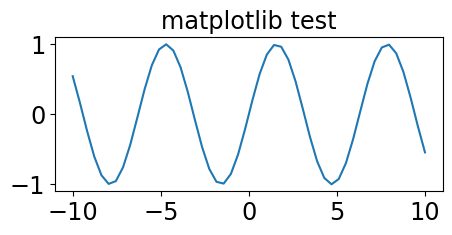

In [8]:
fig=plt.figure(figsize=(5,2))
ax=fig.add_subplot(1,1,1)
X=np.linspace(-10,10,50)
Y=np.sin(X)
ax.plot(X,Y)
plt.title("matplotlib test")
plt.show()


In [9]:
from iminuit import Minuit
import iminuit

In [10]:
iminuit.__version__

'2.22.0'

In [11]:
import scipy
print(scipy.__version__)

1.10.1


In [12]:
from astropy.io import fits
from astropy.coordinates import Angle
from astropy import units as u
from spectractor import parameters
from spectractor.extractor.extractor import Spectractor,dumpParameters
#dumpfitparameters
from spectractor.extractor.images import *
from spectractor.config import load_config, set_logger
from scipy import ndimage, misc

In [13]:
import logging

In [14]:
from scipy.stats import kurtosis,skew
from scipy.stats import kurtosistest,skewtest,normaltest

In [15]:
from distutils.dir_util import copy_tree
import shutil

In [16]:
from astroquery.simbad import Simbad
import astroquery
astroquery.__version__
result_table = Simbad.query_object("M1")

In [17]:
def find_target_name(tag):
    try:
        target_name=tag
        result_table = Simbad.query_object(target_name)
        return target_name
    except:
        target_name_stripped = ''.join(tag.split())
        result_table = Simbad.query_object(target_name_stripped)
        return target_name_stripped 
           

# Configuration

## Logger

In [18]:
my_logger = logging

## Config for the notebook

In [19]:
version="v8.0"  # version for taking images from data/2023 (images come from usdf)
# create output directories if not exist and clean existing files
FLAG_MANAGE_OUTPUT_SPECTRACTOR=True
# allow to run reconstruction with Spectractor
FLAG_GO_FOR_RECONSTRUCTION_WTH_SPECTRACTOR=True
FLAG_RUNWITHEXCEPTIONS = False

## Configuration for Spectractor

In [20]:
print("List of configuration files available : ",os.listdir("config"))

List of configuration files available :  ['auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_findrot_Sept2023.ini', 'auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini', 'auxtel_config_holo_DECONVOLUTION_FFMv_REBIN1_Janv2023.ini']


### config files
- auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_findrot_Sept2023.ini with holo4_001 because rotation of angle with hessian

- auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini or 
  auxtel_config_holo_DECONVOLUTION_FFMv_REBIN1_Janv2023.ini, with holo4_003 becaus no rotation angle is required

In [21]:
# Choose the config filename
list_of_spectractorconfigfiles= ['auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini' ,
                                'auxtel_config_holo_DECONVOLUTION_FFMv_REBIN1_Janv2023.ini',
                                'auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_findrot_Sept2023.ini']
# because holo4_001 is slightly rotated compared to holo4_003, we need to activate in Spectractor the search of the rotation angle by hessian method
config_idx = len(list_of_spectractorconfigfiles)-3
                                
configfilename= os.path.join("./config",list_of_spectractorconfigfiles[config_idx])
#configdir = (list_of_spectractorconfigfiles[config_idx].split("_")[-1]).split(".") [0]
configdir = "config_" + (list_of_spectractorconfigfiles[config_idx].split("auxtel_config_holo_")[-1]).split(".") [0]

In [22]:
configfilename

'./config/auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini'

In [23]:
configdir

'config_DECONVOLUTION_FFMv_REBIN2_Janv2023'

In [24]:
! pwd

/sdf/data/rubin/user/dagoret/AuxTel_summit_tests_2023/runspectractor_standalone/2023_09


In [25]:
config=configfilename
print(f">>>>> Spectractor configuration filename : {configfilename}")

>>>>> Spectractor configuration filename : ./config/auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini


In [26]:
load_config(configfilename)

In [27]:
dumpParameters()

ASTROMETRYNET_DIR 
BGD_ORDER 1
CALIB_BGD_NPARAMS 4
CALIB_BGD_ORDER 3
CALIB_BGD_WIDTH 15
CALIB_PEAK_WIDTH 7
CALIB_SAVGOL_ORDER 2
CALIB_SAVGOL_WINDOW 5
CCD_ARCSEC2RADIANS 4.84813681109536e-06
CCD_GAIN 1.1
CCD_IMSIZE 2048
CCD_MAXADU 170000
CCD_PIXEL2ARCSEC 0.1904
CCD_PIXEL2MM 0.02
CCD_REBIN 2
CONFIG_DIR ../config/
DEBUG False
DEBUG_LOGGING False
DISPERSER_DIR extractor/dispersers/
DISPLAY False
DISTANCE2CCD 181
DISTANCE2CCD_ERR 0.4
FLAM_TO_ADURATE 5175865186660.421
GRATING_ORDER_2OVER1 0.1
LAMBDAS [ 300  301  302  303  304  305  306  307  308  309  310  311  312  313
  314  315  316  317  318  319  320  321  322  323  324  325  326  327
  328  329  330  331  332  333  334  335  336  337  338  339  340  341
  342  343  344  345  346  347  348  349  350  351  352  353  354  355
  356  357  358  359  360  361  362  363  364  365  366  367  368  369
  370  371  372  373  374  375  376  377  378  379  380  381  382  383
  384  385  386  387  388  389  390  391  392  393  394  395  396  397
  3

In [28]:
dir(parameters)

['ASTROMETRYNET_DIR',
 'BGD_ORDER',
 'CALIB_BGD_NPARAMS',
 'CALIB_BGD_ORDER',
 'CALIB_BGD_WIDTH',
 'CALIB_PEAK_WIDTH',
 'CALIB_SAVGOL_ORDER',
 'CALIB_SAVGOL_WINDOW',
 'CCD_ARCSEC2RADIANS',
 'CCD_GAIN',
 'CCD_IMSIZE',
 'CCD_MAXADU',
 'CCD_PIXEL2ARCSEC',
 'CCD_PIXEL2MM',
 'CCD_REBIN',
 'CONFIG_DIR',
 'DEBUG',
 'DEBUG_LOGGING',
 'DISPERSER_DIR',
 'DISPLAY',
 'DISTANCE2CCD',
 'DISTANCE2CCD_ERR',
 'FLAM_TO_ADURATE',
 'GRATING_ORDER_2OVER1',
 'LAMBDAS',
 'LAMBDA_MAX',
 'LAMBDA_MIN',
 'LAMBDA_STEP',
 'LIBRADTRAN_DIR',
 'LINEWIDTH',
 'OBS_ALTITUDE',
 'OBS_CAMERA_DEC_FLIP_SIGN',
 'OBS_CAMERA_RA_FLIP_SIGN',
 'OBS_CAMERA_ROTATION',
 'OBS_DIAMETER',
 'OBS_EPOCH',
 'OBS_FULL_INSTRUMENT_TRANSMISSON',
 'OBS_LATITUDE',
 'OBS_NAME',
 'OBS_OBJECT_TYPE',
 'OBS_QUANTUM_EFFICIENCY',
 'OBS_SECONDARY_DIAMETER',
 'OBS_SURFACE',
 'OBS_TELESCOPE_TRANSMISSION',
 'OBS_TRANSMISSION_SYSTEMATICS',
 'PAPER',
 'PIXDIST_BACKGROUND',
 'PIXSHIFT_PRIOR',
 'PIXWIDTH_BACKGROUND',
 'PIXWIDTH_BOXSIZE',
 'PIXWIDTH_SIGNAL',
 'P

# Exposure config

In [29]:
! ls logbooks

auxtellogbook_collimator~holo4_003_20230912_v7.0.csv
auxtellogbook_collimator~holo4_003_20230913_v7.0.csv
auxtellogbook_collimator~holo4_003_20230914_v7.0.csv
auxtellogbook_cyl_lens~holo4_001_20230912_v7.0.csv
auxtellogbook_cyl_lens~holo4_003_20230912_v7.0.csv
auxtellogbook_cyl_lens~holo4_003_20230913_v7.0.csv
auxtellogbook_empty~holo4_001_20230912_v7.0.csv
auxtellogbook_empty~holo4_001_20230913_v7.0.csv
auxtellogbook_empty~holo4_001_20230914_v7.0.csv
auxtellogbook_empty~holo4_003_20230815_v7.0.csv
auxtellogbook_empty~holo4_003_20230817_v7.0.csv
auxtellogbook_empty~holo4_003_20230912_v7.0.csv
auxtellogbook_empty~holo4_003_20230913_v7.0.csv
auxtellogbook_empty~holo4_003_20230914_v7.0.csv
auxtellogbook_myflatfielding_collimator~holo4_003_20230914_v8.0.csv


In [30]:
# path index for each month

DATE = '20230117'
all_filterdispersernames = ["empty~holo4_001",\
                        "empty~holo4_003",\
                        "collimator~holo4_003",\
                        "cyl_lens~holo4_001",\
                        "cyl_lens~holo4_003",\
                       ]
filterdispersername = all_filterdispersernames[1]

version="v8.0"  # (can process any imagemode)

#imagemode = "postISRCCD"
#imagemode = "unflattened"
# imagemode : myflatfielding or mypostisrccd or dmpostisrccd
imagemode = "myflatfielding"

In [31]:
disperser_label = filterdispersername.split("~")[-1]

## Paths

In [32]:
def GetPaths(computer_name):
    """
    """
    
    if computer_name == "HOSTCC":
        
        path_auxtel="/sps/lsst/groups/auxtel"
        path_spectractor=os.path.join(path_auxtel,"softs/github/desc/Spectractor")
        path_spectractor_config=os.path.join(path_spectractor,"config")
    
        path_images=os.path.join(path_auxtel,"data/hack_usdf/my_postisrccd_img_forspectractor_2023/"+filterdispersername+"/"+DATE)
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)
        
    elif computer_name == "LAPTOP1":
        path_auxtel="/Users/dagoret/DATA/AuxTelData2023"
        path_spectractor=os.path.join(path_auxtel,"/Users/dagoret/MacOSX/GitHub/LSST/Spectractor")
        path_spectractor_config=os.path.join(path_spectractor,"config")
        path_images=os.path.join(path_auxtel,"data/2023/"+filterdispersername+"/"+DATE)
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)
        
        
    elif computer_name == "WORKIMAC":
        path_auxtel="/Users/sylvie/DATA/AuxTelData2023"
        path_spectractor=os.path.join(path_auxtel,"/Users/sylvie/MacOSX/GitHub/LSST/Spectractor")
        path_spectractor_config=os.path.join(path_spectractor,"config")
        path_images=os.path.join(path_auxtel,"data/2023/"+filterdispersername+"/"+DATE)
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"data/2023/OutputSpectractor/"+imagemode)
            
            
        
    elif computer_name == "HOMEIMAC":
        path_auxtel="/Volumes/Backup2020/DATA"
        path_spectractor=os.path.join(path_auxtel,"MacOSX/GitHub/LSST/Spectractor")
        path_spectractor_config=os.path.join(".","config")
        path_images=os.path.join(path_auxtel,"hack_usdf/my_postisrccd_img_forspectractor_2023/"+filterdispersername+"/"+DATE)
        
        # /Volumes/Backup2020/DATA/AuxTelDATA2023/data/2023/OutputSpectractor
        
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"AuxTelDATA2023/data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"AuxTelDATA2023/data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"AuxTelDATA2023/data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"AuxTelDATA2023/data/2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"AuxTelDATA2023/data/2023/OutputSpectractor/"+imagemode)
    # /home/d/dagoret/rubin-user/DATA/AuxtelData2023/my_postisrccd_img_forspectractor_2023/empty~holo4_003
    elif computer_name == "USDF":
        path_auxtel="/home/d/dagoret/rubin-user/DATA"
        path_spectractor=os.path.join("/home/d/dagoret","repos/repos_w_2023_35/Spectractor")
        path_spectractor_config=os.path.join(".","config")
        # image mode myflatfielding or mypostisrccd or dmpostisrccd
        if imagemode == "mypostisrccd":
            path_images=os.path.join(path_auxtel,"AuxtelData2023/my_postisrccd_img_forspectractor_2023/"+filterdispersername+"/"+DATE)
        elif imagemode == "dmpostisrccd":
            path_images=os.path.join(path_auxtel,"AuxtelData2023/dm_postisrccd_img_forspectractor_2023/"+filterdispersername+"/"+DATE)
        elif imagemode == "myflatfielding":
            path_images=os.path.join(path_auxtel,"AuxtelData2023/my_flatfield_img_forspectractor_2023/"+filterdispersername+"/"+DATE)
        else:
            msg = f"ERROR : imagemode = {imagemode} Not found"
            print(msg)
        
        # /Volumes/Backup2020/DATA/AuxTelDATA2023/data/2023/OutputSpectractor
        
        if configdir == "":
            path_output_spectractor=os.path.join(path_auxtel,"AuxtelData2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+DATE)
        else:
            path_output_spectractor=os.path.join(path_auxtel,"AuxtelData2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir+"/"+DATE)
            path_topoutput_spectractor=os.path.join(path_auxtel,"AuxtelData2023/OutputSpectractor/"+imagemode+"/"+filterdispersername+"/"+configdir)
            path_toptopoutput_spectractor=os.path.join(path_auxtel,"AuxtelData2023/OutputSpectractor/"+imagemode+"/"+filterdispersername)
            path_toptoptopoutput_spectractor=os.path.join(path_auxtel,"AuxtelData2023/OutputSpectractor/"+imagemode)
        
        
        
    else:
        print(f"Unknown computer {computer_name}")
        
              
    return path_auxtel,path_spectractor,path_spectractor_config,path_images,path_toptoptopoutput_spectractor, path_toptopoutput_spectractor, path_topoutput_spectractor, path_output_spectractor
        

In [33]:
mycomputer_name = "USDF"
path_auxtel,path_spectractor,path_spectractor_config,path_images,path_toptoptopoutput_spectractor, path_toptopoutput_spectractor, path_topoutput_spectractor, path_output_spectractor  = GetPaths(mycomputer_name)

In [34]:
path_images

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/my_flatfield_img_forspectractor_2023/collimator~holo4_003/20230914'

In [35]:
path_topoutput_spectractor

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023'

In [36]:
path_output_spectractor

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914'

# Utility Functions

In [37]:
def is_nan(x):
    return (x != x)

# Logbook for input file selection

- the logbook contains all input image path and possibily the order 0 position

In [38]:
!ls logbooks

auxtellogbook_collimator~holo4_003_20230912_v7.0.csv
auxtellogbook_collimator~holo4_003_20230913_v7.0.csv
auxtellogbook_collimator~holo4_003_20230914_v7.0.csv
auxtellogbook_cyl_lens~holo4_001_20230912_v7.0.csv
auxtellogbook_cyl_lens~holo4_003_20230912_v7.0.csv
auxtellogbook_cyl_lens~holo4_003_20230913_v7.0.csv
auxtellogbook_empty~holo4_001_20230912_v7.0.csv
auxtellogbook_empty~holo4_001_20230913_v7.0.csv
auxtellogbook_empty~holo4_001_20230914_v7.0.csv
auxtellogbook_empty~holo4_003_20230815_v7.0.csv
auxtellogbook_empty~holo4_003_20230817_v7.0.csv
auxtellogbook_empty~holo4_003_20230912_v7.0.csv
auxtellogbook_empty~holo4_003_20230913_v7.0.csv
auxtellogbook_empty~holo4_003_20230914_v7.0.csv
auxtellogbook_myflatfielding_collimator~holo4_003_20230914_v8.0.csv


In [39]:
#filename_logbook ='logbooks/auxtellogbook_'+filterdispersername+"_"+DATE+'_' + version+'.csv'
dir_logbooks="logbooks"
filename_logbook =os.path.join(dir_logbooks,"auxtellogbook_" + imagemode +"_" + filterdispersername + "_"+ DATE +"_" + version + ".csv")

In [40]:
filename_logbook

'logbooks/auxtellogbook_myflatfielding_collimator~holo4_003_20230914_v8.0.csv'

In [41]:
df=pd.read_csv(filename_logbook,index_col=0)

In [42]:
pd.set_option('display.max_rows', None)

In [43]:
# show the list of input files from the logbook to select the file index in the logbook
df

,index,date,path,file,num,object,filter,disperser,airmass,exposure,...,temperature,humidity,windspd,Obj-posXpix,Obj-posYpix,Dx,Dy,skip,run,quality
0,0,2023-09-15T03:15:59.740,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400132_flatten_v1.fits,132,HD160617,collimator,holo4_003,1.672494,30.0,...,14.6875,12.9250,2.5020,NaN,NaN,NaN,NaN,,NaN,NaN
1,1,2023-09-15T03:15:59.740,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400132_flatten_v2.fits,132,HD160617,collimator,holo4_003,1.672494,30.0,...,14.6875,12.9250,2.5020,NaN,NaN,NaN,NaN,,NaN,NaN
2,2,2023-09-15T03:15:59.740,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400132_flatten_v3.fits,132,HD160617,collimator,holo4_003,1.672494,30.0,...,14.6875,12.9250,2.5020,NaN,NaN,NaN,NaN,,NaN,NaN
3,3,2023-09-15T03:15:59.740,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400132_flatten_v4.fits,132,HD160617,collimator,holo4_003,1.672494,30.0,...,14.6875,12.9250,2.5020,NaN,NaN,NaN,NaN,,NaN,NaN
4,4,2023-09-15T03:42:29.583,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400157_flatten_v1.fits,157,HD205905,collimator,holo4_003,1.022632,30.0,...,14.6750,13.1250,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN
5,5,2023-09-15T03:42:29.583,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400157_flatten_v2.fits,157,HD205905,collimator,holo4_003,1.022632,30.0,...,14.6750,13.1250,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN
6,6,2023-09-15T03:42:29.583,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400157_flatten_v3.fits,157,HD205905,collimator,holo4_003,1.022632,30.0,...,14.6750,13.1250,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN
7,7,2023-09-15T03:42:29.583,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400157_flatten_v4.fits,157,HD205905,collimator,holo4_003,1.022632,30.0,...,14.6750,13.1250,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN
8,8,2023-09-15T03:43:12.547,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400158_flatten_v1.fits,158,HD205905,collimator,holo4_003,1.023214,30.0,...,14.6750,13.1500,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN
9,9,2023-09-15T03:43:12.547,/home/d/dagoret/rubin-user/DATA/AuxtelData2023...,exposure_2023091400158_flatten_v2.fits,158,HD205905,collimator,holo4_003,1.023214,30.0,...,14.6750,13.1500,2.2518,NaN,NaN,NaN,NaN,,NaN,NaN


# Selection of input file
- the input file is selected from the logbook list above

In [44]:
idx = 27

In [45]:
print(df.iloc[idx]['file'])

exposure_2023091400215_flatten_v4.fits


In [46]:
print(df.iloc[idx])

index                                                         27
date                                     2023-09-15T04:28:03.956
path           /home/d/dagoret/rubin-user/DATA/AuxtelData2023...
file                      exposure_2023091400215_flatten_v4.fits
num                                                          215
object                                                    HD2811
filter                                                collimator
disperser                                              holo4_003
airmass                                                 1.060856
exposure                                                    30.0
focus                                                   0.002624
seeing                                                      1.15
pressure                                              743.299988
temperature                                                14.55
humidity                                                  13.125
windspd                  

In [47]:
the_num = df.iloc[idx]["num"]

In [48]:
myhome=os.getenv("HOME")

In [49]:
dir_images=path_images

In [50]:
dir_images

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/my_flatfield_img_forspectractor_2023/collimator~holo4_003/20230914'

In [51]:
filename_image=df['file'][idx]
filename_image

'exposure_2023091400215_flatten_v4.fits'

In [52]:
target = df['object'][idx]
target

'HD2811'

## If order 0 position exists in logbook it is selected, otherwise put it by hand

In [53]:
# ## If order 0 position exists in logbook it is selected, otherwise put it by hand

x0=300
y0=1700

if 'Obj-posXpix' in df.columns and 'Obj-posYpix' in df.columns:
    thex0 = df['Obj-posXpix'][idx]
    if not is_nan(thex0):
        x0=thex0
    they0 = df['Obj-posYpix'][idx]
    if not is_nan(they0):
        y0=they0
    
if not is_nan(x0) and not is_nan(y0):

    print("Order 0 location from logbook : ({},{})".format(x0,y0))
else:
    print("NO Order 0 location from logbook ! ")      

print(f"guess (x0,y0) = ({x0},{y0})")


Order 0 location from logbook : (300,1700)
guess (x0,y0) = (300,1700)


## Spectractor Configuration 

- Usually the Spectractor configuration file is put in local dir **./config**


Ma suggestion, pour l'étude du centre optique via les scans des hologrammes, est de **mettre SPECTRACTOR_COMPUTE_ROTATION_ANGLE sur False** . 

Comme les angles ne sont pas très grands, si les marges du rectangle sont assez larges, réglables avec : 

    [background subtraction parameters] 
    # half transverse width of the signal rectangular window in pixels 
    PIXWIDTH_SIGNAL = 40 

alors le spectrogramme devrait tenir dans une boite rectangulaire même sans rotation de l'image. **L'important est de garder SPECTRACTOR_DECONVOLUTION_FFM à True car c'est lui qui te donnera l'angle de l'axe de dispersion ajusté sur les données, dont la valeur sera dans le mot clé ROTANGLE du header de sortie**. 


In [54]:
rootfilename = filename_image.split(".")[0]
rootfilename_split =  rootfilename.split("_") 
filenumberdir = rootfilename_split[1] 

In [55]:
path_output_spectractor

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914'

In [56]:
configdir

'config_DECONVOLUTION_FFMv_REBIN2_Janv2023'

In [57]:

# Fullfilename
filename=os.path.join(dir_images,filename_image)


# subdirectory
#subdir=filename_image.split(".")[0]
subdir=filenumberdir

# final output directory (where results will be copied to be backed up at the end)
finalpath_output_spectractor=os.path.join(path_output_spectractor,subdir)


# local directories to put spectra and plots
    
if configdir =="":
    output_directory="./outputs_process_" + DATE  + '_' + dispersername +'_nb_' + str(idx+1)
    output_figures="figures_process_" + DATE + '_' + dispersername + '_nb_' + str(idx+1)
else:
    output_directory = "./outputs_process_"+ DATE +"_"+ filterdispersername + "_" + configdir + "_nb_" + str(idx+1)
    output_figures   = "./figures_process_"+ DATE +"_"+ filterdispersername + "_" + configdir + "_nb_" + str(idx+1)
    
    

#guess = [300,1700]
guess = [350,1700]

# configuration

config=configfilename    
target=df.iloc[idx]["object"]

In [58]:
print(f"finalpath_output_spectractor = {finalpath_output_spectractor}")
print(f"output_directory = {output_directory}")
print(f"output_figures = {output_figures}")
print(f"config filename = {config}")

finalpath_output_spectractor = /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215
output_directory = ./outputs_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28
output_figures = ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28
config filename = ./config/auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini


In [59]:
def cleandir(path):
    if os.path.isdir(path):
        files=os.listdir(path)
        if len(files) > 0:
            for f in files:
                if os.path.isdir(os.path.join(path,f)):
                    if f==".ipynb_checkpoints":
                        shutil.rmtree(os.path.join(path,f))
                    else:
                        print(" Cannot remove this directory {}".format(os.path.join(path,f)))
                else:
                    os.remove(os.path.join(path,f))

In [60]:
if not os.path.isdir(output_directory):
    os.mkdir(output_directory)
else:
    cleandir(output_directory)
    
# manage subdirs spectrum/ and plots/

if not os.path.isdir(output_figures):
    os.mkdir(output_figures)
else:
    cleandir(output_figures)

# Configuration of the Spectractor running mode

In [61]:
parameters.LSST_SAVEFIGPATH=True
parameters.LSST_SAVEFIGPATH=output_figures

In [62]:
parameters.debug=True
parameters.verbose=True
parameters.display=True
parameters.LIVE_FIT=False

In [63]:
target_name_sel0 = find_target_name(target)
print(f"target_name_sel0 = {target_name_sel0}")
#target_name_sel0 = ''.join(target.split())
#target_name_sel1 = target_name_sel0.encode(encoding='UTF-8',errors='strict')
#target_name_sel = target_name_sel0.encode()
target_name_sel = target_name_sel0.encode(encoding="ascii", errors="ignore")
print(f'target_name_sel = {target_name_sel}')
#target_name_sel=f"{target_name_sel}"

target_name_sel0 = HD2811
target_name_sel = b'HD2811'


## Load the image in the new image file with Spectractor

In [64]:
if target_name_sel == 'MU-COL':
    target_name_sel = "HD38666"

In [65]:
disperser_label

'holo4_003'

In [66]:
%matplotlib inline
image=Image(file_name=filename, disperser_label=disperser_label,target_label=target_name_sel, config=config)

2023-09-21 13:32:22  Image      check_statistical_error WARNING 
	Fitted read out noise seems to be different than input readout noise. Fit=4.2164190498537995 but average of self.read_out_noise is 8.5.


In [67]:
image.data.shape

(4072, 4000)

## Show relevant parameters

In [68]:
parameters.LSST_SAVEFIGPATH=True
parameters.LSST_SAVEFIGPATH=output_figures

In [69]:
image.header["FILTER"]

'collimator'

In [70]:
image.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
CCD_MANU= 'ITL     '                                                            
CCD_TYPE= '3800C   '                                                            
DETSIZE = '[1:4072,1:4000]'                                                     
BINX    =                    1                                                  
BINY    =                    1                                                  
CCDGAIN =                  1.0                                                  
CCDNOISE=                 10.0                                                  
CCDSLOT = 'S00     '                                                            
RAFTBAY = 'R00     '        

# Plot image and find the target position

- this image plotting is used to find the order 0 location to be set in logbook

- for the moment this is humanly done

## Load the new image file with Spectractor

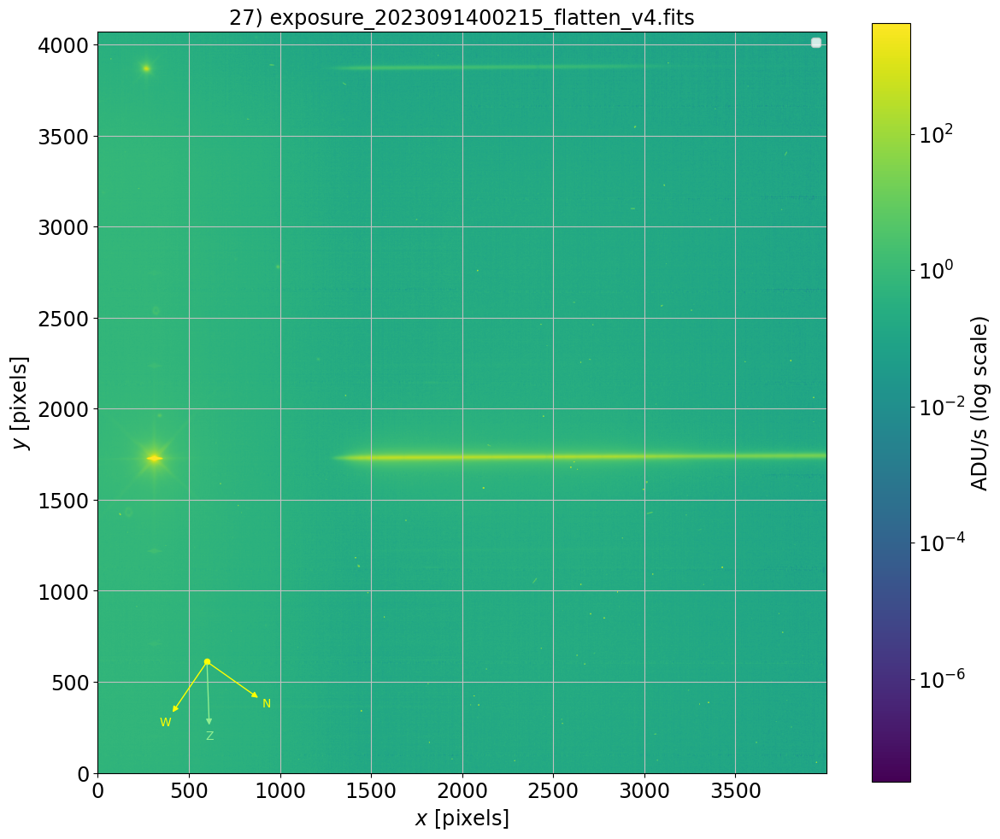

In [71]:
import matplotlib.pyplot as plt
%matplotlib inline
title="{}) {}".format(idx,filename_image)
image.plot_image(figsize=(12, 10),scale="log",title=title)
plt.show()

- note now the position are written in the make_logbook.ipynb notebook

## Set the 0th order location to be provided to Spectractor

In [72]:
filename_image

'exposure_2023091400215_flatten_v4.fits'

## Let Spectractor find the location of the 0th order

2023-09-21 13:32:29  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0               c1_0                 c0_1        
    ----------------- -------------------- --------------------
    5.897363844922062 -0.03371958008971714 0.022119624897125573


2023-09-21 13:32:29  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 14 iterations because the relative change of cost is below ftol=1.25e-05.


2023-09-21 13:32:30  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 2 iterations because the relative change of cost is below ftol=5e-05.


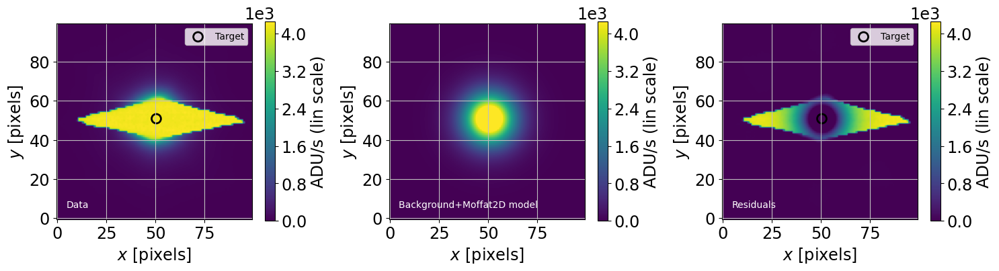

In [73]:
parameters.VERBOSE = True
parameters.DEBUG = True
#x1, y1 = find_target(image, guess,rotated=False, use_wcs=False)
x1, y1 = find_target(image, guess,rotated=False)

In [74]:
print(x1,y1)

311.4849810701179 1728.8456351594502


## Check the location of 0th order and Analysis of the quality of its focus

In [75]:
if x1>100:
    WID=100
else:
    WID=50
    

thumbnail=np.copy(image.data[int(y1)-WID:int(y1)+WID,int(x1)-WID:int(x1)+WID])
thumbnail_y=thumbnail.sum(axis=1)
thumbnail_x=thumbnail.sum(axis=0)
xx=np.linspace(int(x1)-WID,int(x1)+WID,len(thumbnail_x))
yy=np.linspace(int(y1)-WID,int(y1)+WID,len(thumbnail_y))
k0=kurtosis(thumbnail,axis=None,bias=True,fisher=True)
kx=kurtosis(thumbnail_x,bias=True,fisher=True)
ky=kurtosis(thumbnail_y,bias=True,fisher=True)
s0=skew(thumbnail,axis=None,bias=True)
sx=skew(thumbnail_x,bias=True)
sy=skew(thumbnail_y,bias=True)
        

In [76]:
shape_str='\n'.join((
        r'skew     : Sk0 = {:3.3f}, Skx = {:3.3f}, Sky = {:3.3f} \n'.format(s0,sx,sy),
        r'kurtosis : K0  = {:3.3f}, Kx  = {:3.3f},  Ky = {:3.3f}'.format(k0,kx,ky)))

In [77]:
skew_str='\n'.join((
        r'skew     : Sk0 = {:3.3f}'.format(s0),
        r'             : Skx = {:3.3f}'.format(sx),
        r'             : Sky = {:3.3f}'.format(sy)))

In [78]:
kurt_str='\n'.join((
        r'kurtosis : K0 = {:3.3f}'.format(k0),
        r'             : Kx = {:3.3f}'.format(kx),
        r'             : Ky = {:3.3f}'.format(ky)))

In [79]:
kurtosis_test_prob=kurtosistest(thumbnail,axis=None).pvalue
skew_test_prob=skewtest(thumbnail,axis=None).pvalue
normal_test_prob=normaltest(thumbnail,axis=None).pvalue

In [80]:
kurtosis_test_val=kurtosistest(thumbnail,axis=None).statistic
skew_test_val=skewtest(thumbnail,axis=None).statistic
normal_test_val=normaltest(thumbnail,axis=None).statistic

In [81]:
kurtosis_test_prob_x=kurtosistest(thumbnail_x).pvalue
skew_test_prob_x=skewtest(thumbnail_x).pvalue
normal_test_prob_x=normaltest(thumbnail_x).pvalue

In [82]:
kurtosis_test_prob_y=kurtosistest(thumbnail_y).pvalue
skew_test_prob_y=skewtest(thumbnail_y).pvalue
normal_test_prob_y=normaltest(thumbnail_y).pvalue

In [83]:
skew_str='\n'.join((
    r'skew     : Sk0 = {:3.3f}'.format(s0),
    r'             : Skx = {:3.3f}'.format(sx),
    r'             : Sky = {:3.3f}'.format(sy),
    r'             : p_test   = {:3.3e}'.format(skew_test_prob),
    r'             : p_test_x = {:3.3e}'.format(skew_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(skew_test_prob_y)))

In [84]:
kurt_str='\n'.join((
    r'kurtosis : K0 = {:3.3f}'.format(k0),
    r'             : Kx = {:3.3f}'.format(kx),
    r'             : Ky = {:3.3f}'.format(ky),
    r'             : p_test   = {:3.3e}'.format(kurtosis_test_prob),
    r'             : p_test_x = {:3.3e}'.format(kurtosis_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(kurtosis_test_prob_y)))

In [85]:
norm_str='\n'.join((
    r'normal  : p_test   = {:3.3e}'.format(normal_test_prob),
    r'             : p_test_x = {:3.3e}'.format(normal_test_prob_x),
    r'             : p_test_y = {:3.3e}'.format(normal_test_prob_y)))

In [86]:
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

In [87]:
#matplotlib.pyplot.hist(x, 
#                       bins=10, 
#                       range=None, 
#                       normed=False, 
#                       weights=None, 
#                       cumulative=False, 
#                       bottom=None, 
#                       histtype=u'bar', 
#                       align=u'mid', 
#                       orientation=u'vertical', 
#                       rwidth=None, 
#                       log=False, 
#                       color=None, 
#                       label=None, 
#                       stacked=False, 
#                       hold=None, 
#                       **kwargs)

Text(0.5, 0.98, '27) exposure_2023091400215_flatten_v4.fits')

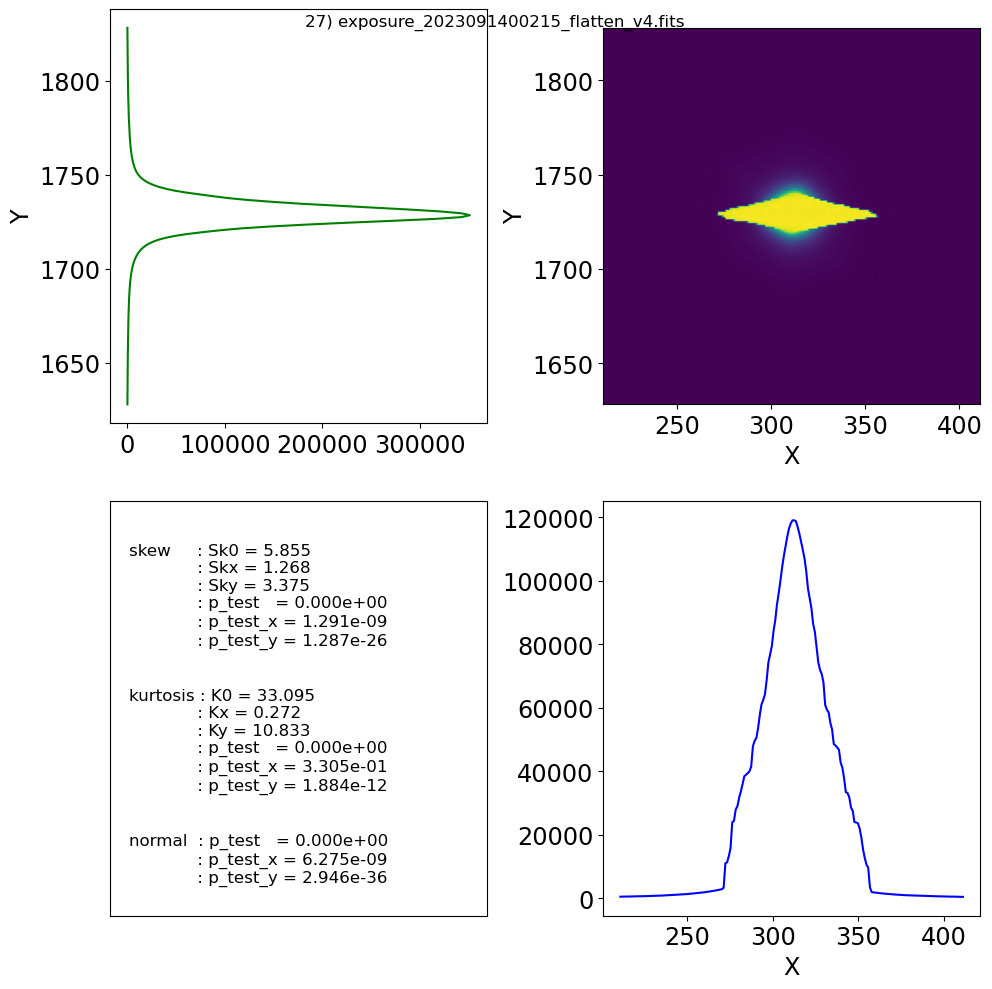

In [88]:
%matplotlib inline
fig=plt.figure(figsize=(10,10))
fig.subplots_adjust(left=0.12, right=0.95, wspace=0.3,
                    bottom=0.15, top=0.9)

ax=fig.add_subplot(222)
ax.imshow(thumbnail,origin="lower",extent=(int(x1)-WID,int(x1)+WID,int(y1)-WID,int(y1)+WID))
ax.set_xlabel("X")
ax.set_ylabel("Y")

ax=fig.add_subplot(221)
base = plt.gca().transData
rot = transforms.Affine2D().rotate_deg(-90)
#ax.plot(yy,thumbnail_y,"g",rotation=u'vertical')
ax.plot(-yy,thumbnail_y,"g",transform= rot + base)
ax.set_ylabel("Y")

ax=fig.add_subplot(224)
ax.plot(xx,thumbnail_x,"b")
ax.set_xlabel("X")
plt.tight_layout()

ax=fig.add_subplot(223)
ax.set_xlim(0,10)
ax.set_ylim(0,10)
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_yticks([])

ax.text(0.05, 0.9, skew_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
ax.text(0.05, 0.55, kurt_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
ax.text(0.05, 0.2, norm_str, transform=ax.transAxes, fontsize=12,verticalalignment='top', bbox=props)
plt.suptitle(title)

In [89]:
# Usually stop here if one just want to get the 0th order location
if not FLAG_GO_FOR_RECONSTRUCTION_WTH_SPECTRACTOR:
    assert False
else:
    assert True

# Go for spectrum reconstruction

In [90]:
parameters.debug=True
parameters.verbose=True
parameters.display=True
parameters.LIVE_FIT=False

parameters.DEBUG=True
parameters.VERBOSE=True
parameters.DISPLAY=True
parameters.LIVE_FIT=False

In [91]:
filename

'/home/d/dagoret/rubin-user/DATA/AuxtelData2023/my_flatfield_img_forspectractor_2023/collimator~holo4_003/20230914/exposure_2023091400215_flatten_v4.fits'

In [92]:
output_directory

'./outputs_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28'

2023-09-21 13:32:31  spectractor.extractor.extractor SpectractorInit      INFO   
	Spectractor initialisation


2023-09-21 13:32:31  spectractor.config load_config          INFO   
	Loading ./config/auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini with parameters.VERBOSE=True...


2023-09-21 13:32:31  spectractor.config load_config          INFO   Loaded ./config/auxtel_config_holo_DECONVOLUTION_FFMv_REBIN2_Janv2023.ini with
Section: paths
x disperser_dir: extractor/dispersers/	=> parameters.DISPERSER_DIR: extractor/dispersers/	 <class 'str'>
x throughput_dir: simulation/AuxTelThroughput/	=> parameters.THROUGHPUT_DIR: simulation/AuxTelThroughput/	 <class 'str'>
Section: pipeline
x spectractor_fit_target_centroid: fit	=> parameters.SPECTRACTOR_FIT_TARGET_CENTROID: fit	 <class 'str'>
x spectractor_compute_rotation_angle: disperser	=> parameters.SPECTRACTOR_COMPUTE_ROTATION_ANGLE: disperser	 <class 'str'>
x spectractor_deconvolution_psf2d: False	=> parameters.SPECTRACTOR_DECONVOLUTION_PSF2D: False	 <class 'bool'>
x spectractor_deconvolution_ffm: True	=> parameters.SPECTRACTOR_DECONVOLUTION_FFM: True	 <class 'bool'>
x spectractor_deconvolution_sigma_clip: 100	=> parameters.SPECTRACTOR_DECONVOLUTION_SIGMA_CLIP: 100	 <class 'int'>
Section: instrument
x obs_name: AUXTE

2023-09-21 13:32:31  Image      load_AUXTEL_image    INFO   
	Loading AUXTEL image /home/d/dagoret/rubin-user/DATA/AuxtelData2023/my_flatfield_img_forspectractor_2023/collimator~holo4_003/20230914/exposure_2023091400215_flatten_v4.fits...


2023-09-21 13:32:31  Image      load_AUXTEL_image    INFO   
	Image loaded


2023-09-21 13:32:31  Image      load_image           INFO   
	Loading disperser holo4_003...


2023-09-21 13:32:31  Hologram   load_specs           INFO   
	Load disperser holo4_003:
	from /home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/extractor/dispersers/holo4_003


2023-09-21 13:32:31  Hologram   load_specs           INFO   
	Grating characteristics:
	N = 150.00 +/- 1.00 grooves/mm
	Average tilt of 0.2 degrees


2023-09-21 13:32:33  Image      check_statistical_error WARNING 
	Fitted read out noise seems to be different than input readout noise. Fit=4.2164190498537995 but average of self.read_out_noise is 8.5.


2023-09-21 13:32:33  TelescopeTransmission reset_lambda_range   INFO   
	With filter collimator, set parameters.LAMBDA_MIN=336 and parameters.LAMBDA_MAX=1092.


2023-09-21 13:32:33  Star       load                 INFO   
	Simbad:
 MAIN_ID        RA           DEC      ... PM_ERR_ANGLE Z_VALUE SCRIPT_NUMBER_ID
             "h:m:s"       "d:m:s"    ...     deg                              
--------- ------------- ------------- ... ------------ ------- ----------------
HD   2811 00 31 18.4898 -43 36 22.998 ...           90      --                1


2023-09-21 13:32:33  spectractor.extractor.extractor SpectractorRun       INFO   
	Run Spectractor


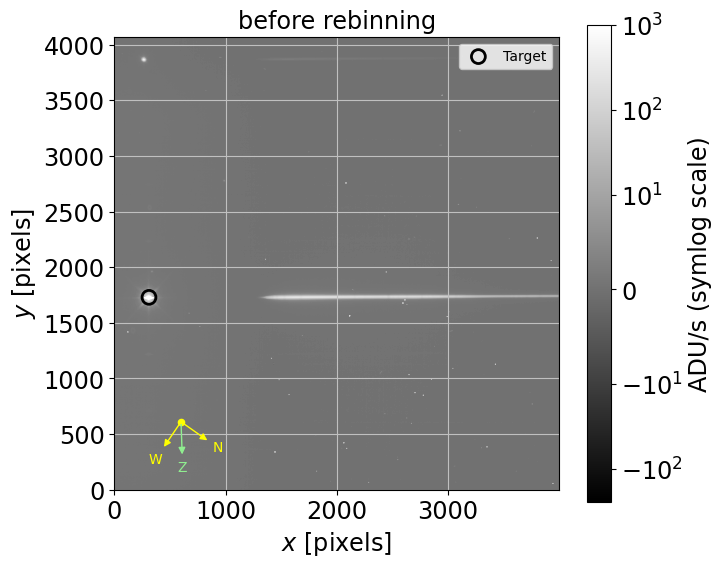

2023-09-21 13:32:41  spectractor.extractor.extractor SpectractorRun       INFO   
	  ======================= REBIN =============================


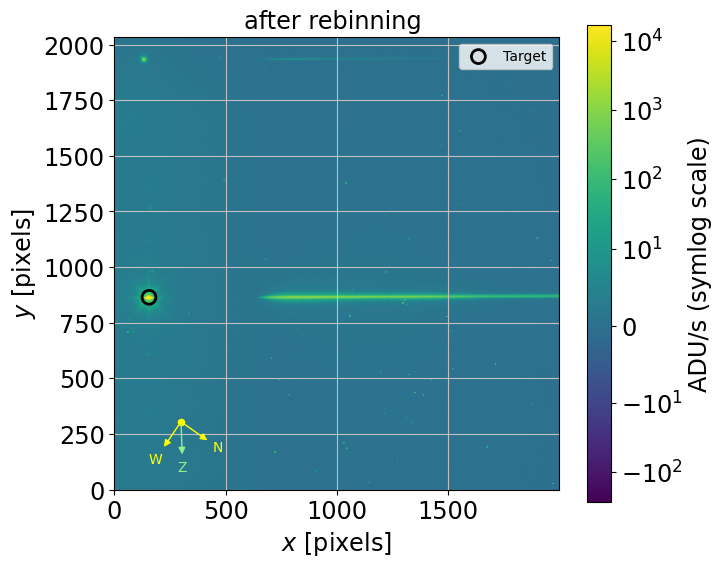

2023-09-21 13:32:43  spectractor.extractor.extractor SpectractorRun       INFO   
	Search for the target in the image with guess=[155.74249054 864.42281758]...


2023-09-21 13:32:43  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0                c1_0                  c0_1        
    ----------------- --------------------- ---------------------
    18.52341666490237 -0.012144938485228726 -0.008842610204844111


2023-09-21 13:32:44  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 8 iterations because the relative change of cost is below ftol=5e-05.


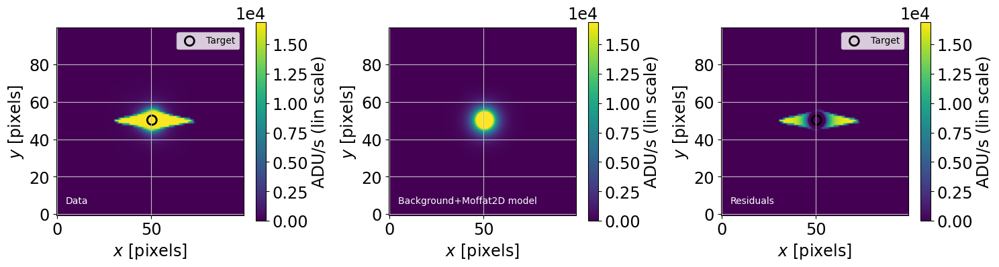

2023-09-21 13:32:44  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 3 iterations because the relative change of cost is below ftol=0.0002.


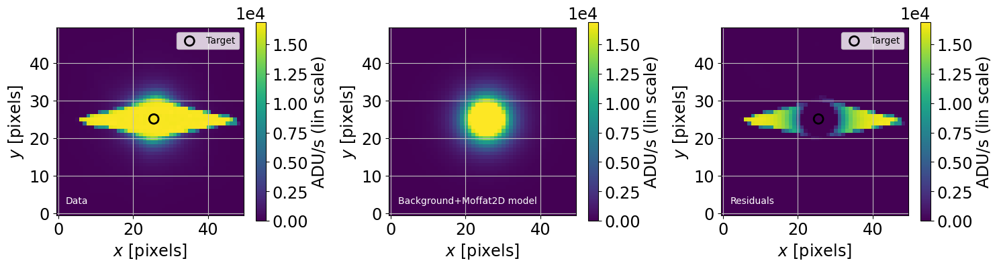

2023-09-21 13:32:45  Image      find_target          INFO   
	X,Y target position in pixels: 155.506,864.153


2023-09-21 13:32:45  Image      turn_image           INFO   
	Rotate the image with angle theta=0.20 degree from method disperser.


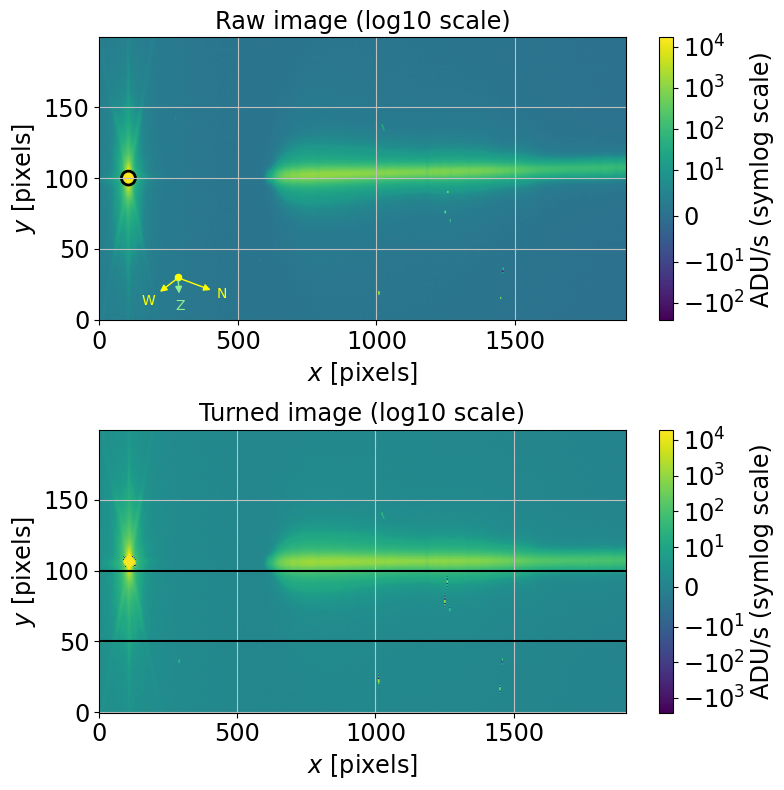

2023-09-21 13:32:47  spectractor.extractor.extractor SpectractorRun       INFO   
	Search for the target in the rotated image...


2023-09-21 13:32:47  spectractor.tools fit_poly2d_outlier_removal INFO   
	Model: Polynomial2D
Inputs: ('x', 'y')
Outputs: ('z',)
Model set size: 1
Degree: 1
Parameters:
           c0_0               c1_0                c0_1       
    ----------------- -------------------- ------------------
    89.45744667642002 -0.09871368823705605 0.5336385419964936


2023-09-21 13:32:47  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 16 iterations because the relative change of cost is below ftol=0.0002.


2023-09-21 13:32:47  Image      find_target_Moffat2D WARNING 
	X=34.63, Y=24.01 target position determination probably wrong: 9.0 pixels from profile detection (25.70, 25.34)


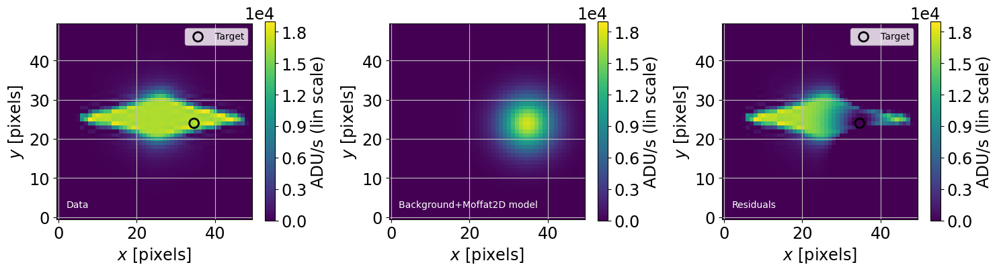

2023-09-21 13:32:48  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 10 iterations because the relative change of cost is below ftol=0.0008680555555555555.


2023-09-21 13:32:48  Image      find_target_Moffat2D WARNING 
	X=11.85, Y=12.04 target position determination probably wrong: 7.2 pixels from profile detection (4.76, 13.32)


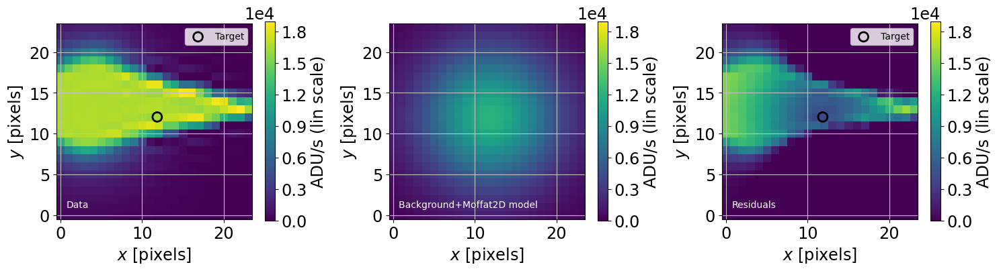

2023-09-21 13:32:49  Image      find_target          INFO   
	X,Y target position in pixels: 166.849,869.037


2023-09-21 13:32:49  Spectrum   __init__             INFO   
	Spectrum info copied from image


2023-09-21 13:32:49  TelescopeTransmission reset_lambda_range   INFO   
	With filter collimator, set parameters.LAMBDA_MIN=343 and parameters.LAMBDA_MAX=1084.


2023-09-21 13:32:49  spectractor.extractor.extractor SpectractorRun       INFO   
	 ======================== PSF1D Extraction ====================================


2023-09-21 13:32:49  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= extract_spectrum_from_image =============================


2023-09-21 13:32:49  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extracting spectrum from image: spectrum with width 2*10 pixels and background from 70 to 90 pixels


2023-09-21 13:32:49  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop rotated image [646:1699,779:959] (size (1053, 180))


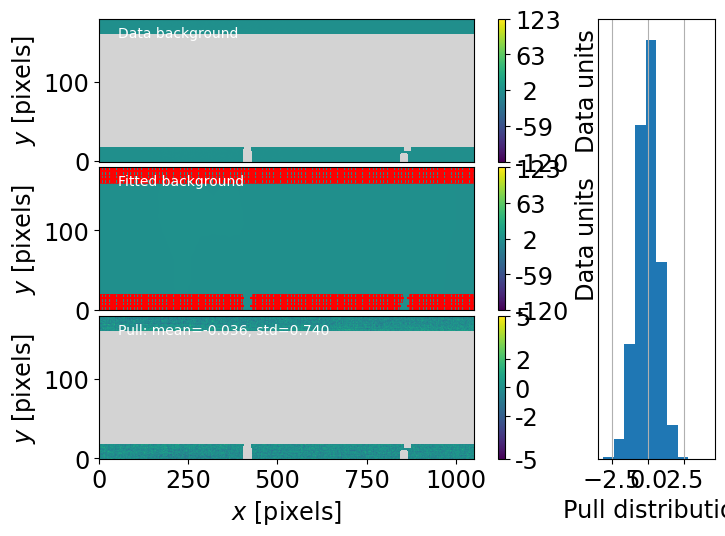

2023-09-21 13:32:49  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= Fit the transverse profile =============================


2023-09-21 13:32:49  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Start PSF1D transverse fit...


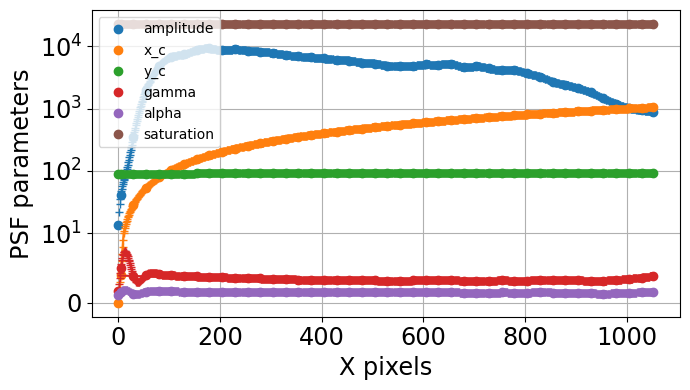

2023-09-21 13:32:51  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	initial cost=2.7689e+05	initial chisq_red=13.148


2023-09-21 13:32:51  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	final cost=1.7388e+05	final chisq_red=8.2566 	computed in 0.25s


2023-09-21 13:32:51  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1:	final cost=1.6809e+05	final chisq_red=7.9816 	computed in 0.25s


2023-09-21 13:32:52  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=2:	final cost=1.6807e+05	final chisq_red=7.9807 	computed in 0.25s


2023-09-21 13:32:52  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=3:	final cost=1.6807e+05	final chisq_red=7.9807 	computed in 0.25s


2023-09-21 13:32:52  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 3 iterations because the relative change of cost is below ftol=4.748338081671415e-05.


2023-09-21 13:32:52  ChromaticPSF1DFitWorkspace run_gradient_descent INFO   
	x_c_0: 1005.1509718164017 (fixed)
	x_c_1: 526.0000000000006 (fixed)
	x_c_2: 7.97710683789267e-14 (fixed)
	y_c_0: 1.5795 +0.0003 -0.0003
	y_c_1: 0.5221 +0.0006 -0.0006
	y_c_2: -0.2576 +0.0008 -0.0008
	gamma_0: 3.898 +0.002 -0.002
	gamma_1: -0.582 +0.004 -0.004
	gamma_2: 0.812 +0.006 -0.006
	alpha_0: 1.767 +0.001 -0.001
	alpha_1: -0.258 +0.002 -0.002
	alpha_2: 0.159 +0.003 -0.003
	saturation_0: 22666.66666666667 (fixed)
	


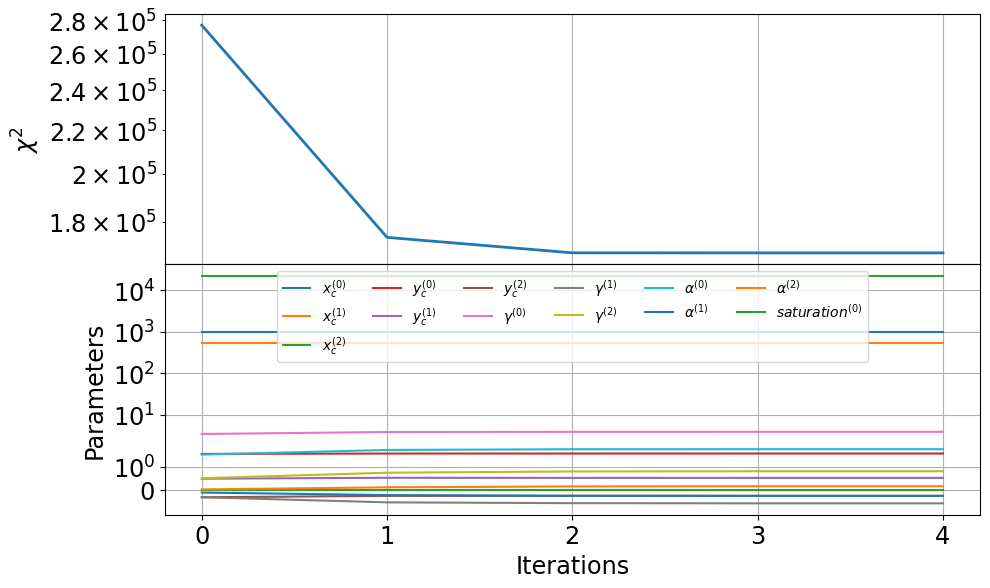

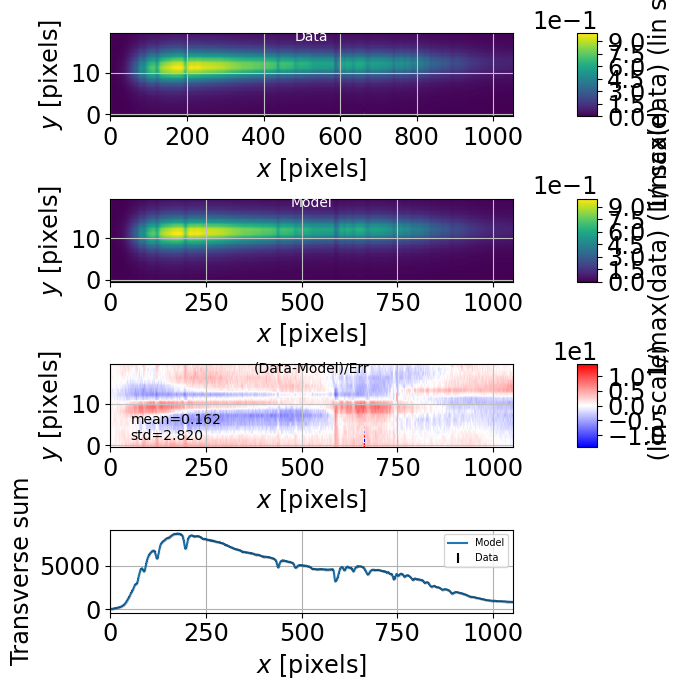

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:470: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


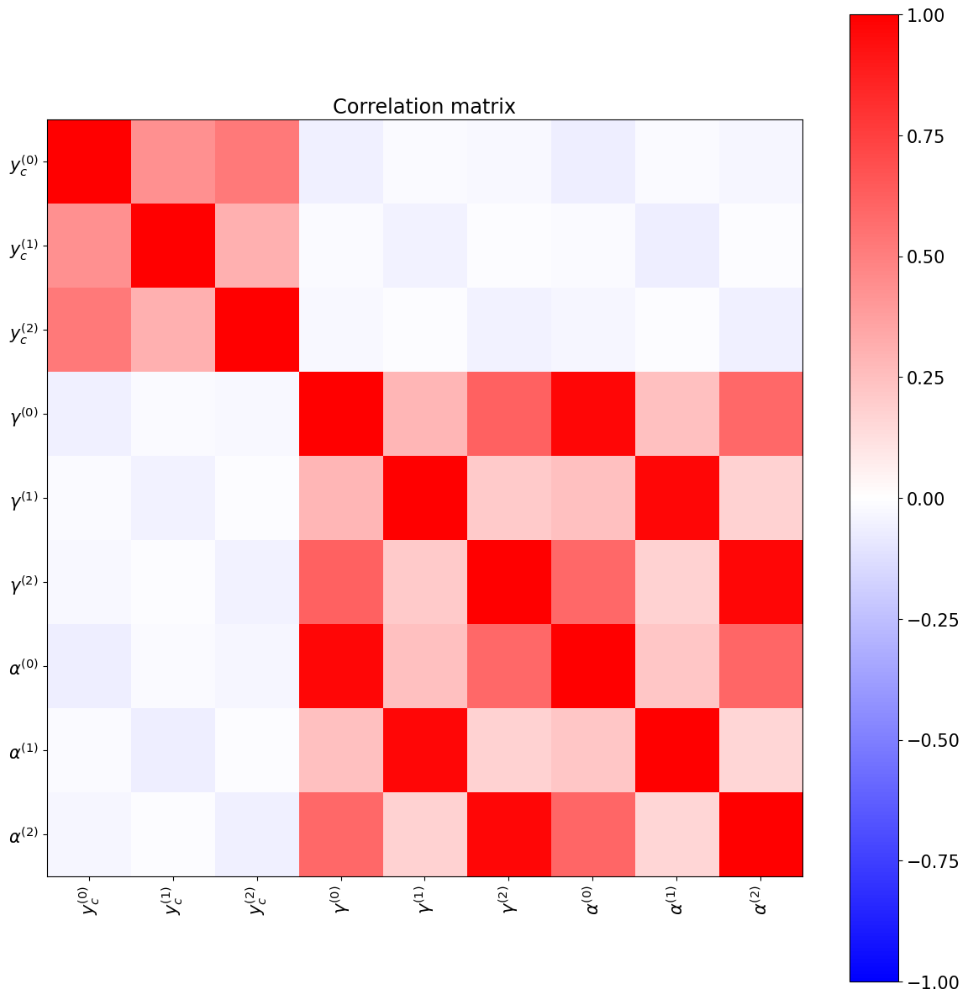

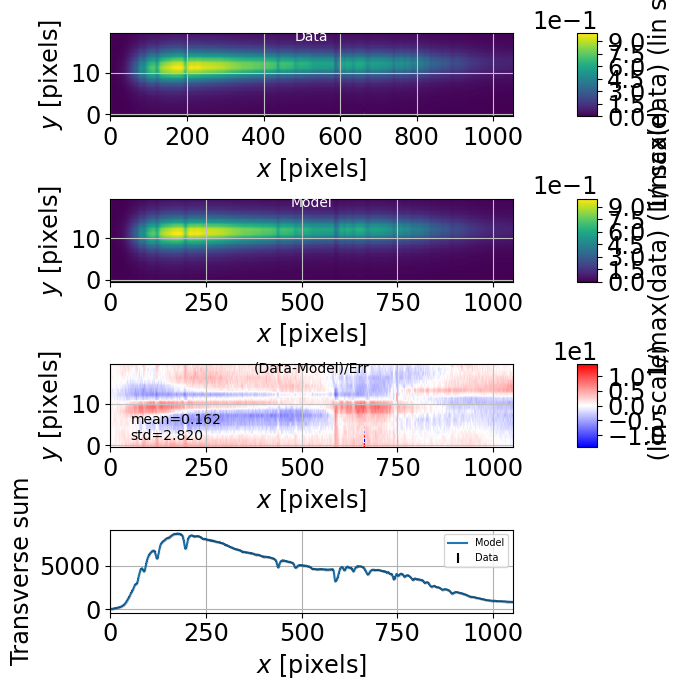

2023-09-21 13:32:55  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop raw image [634:1687,775:960] (size (1053, 185))


2023-09-21 13:32:55  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= Extract the non rotated background  =============================


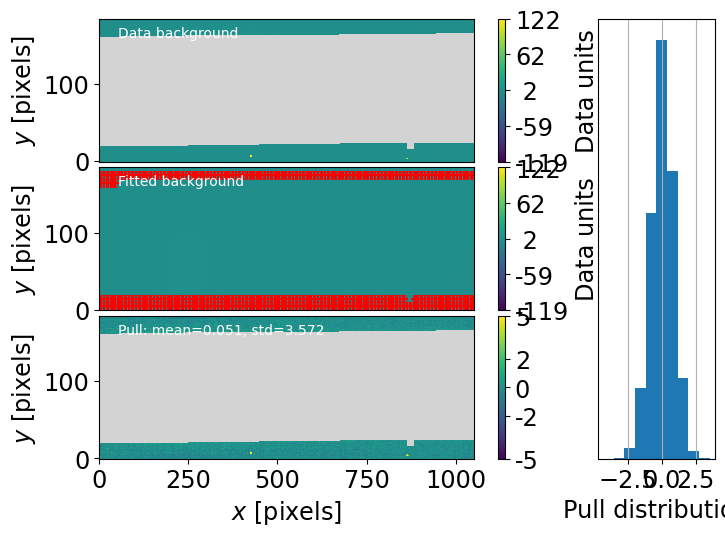

2023-09-21 13:32:56  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Background statistics: mean=1.277 ADU/s, RMS=0.435 ADU/s.


2023-09-21 13:32:56  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	  ======================= first guess for lambdas  =============================


2023-09-21 13:32:56  spectractor.extractor.extractor extract_spectrum_from_image INFO   
	Extract spectrogram: crop image [634:1687,775:960] (size (1053, 185))
	New target position in spectrogram frame: [-478.4940894352183, 89.15286362278346]


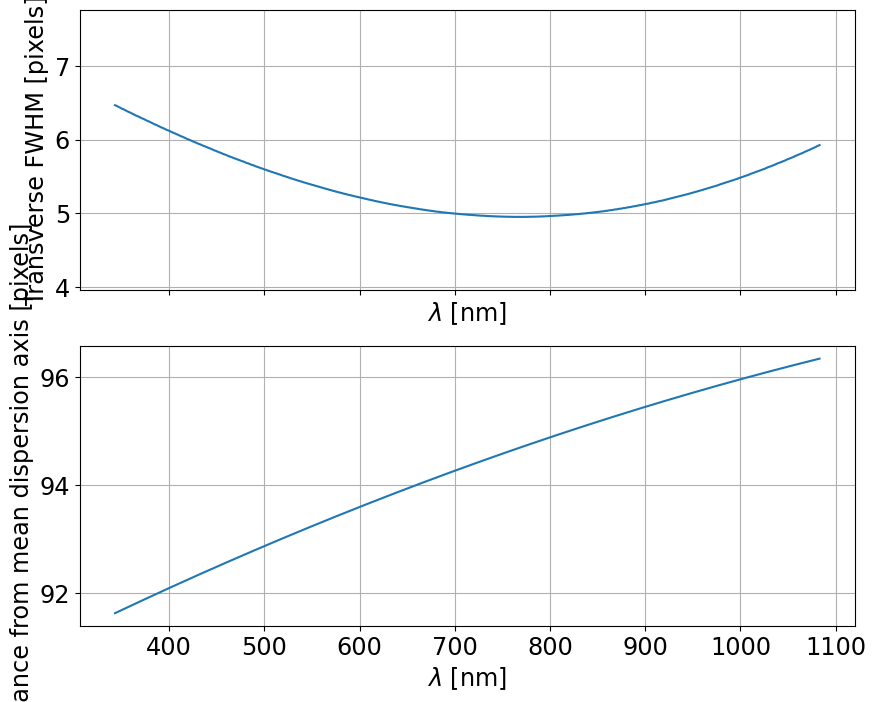

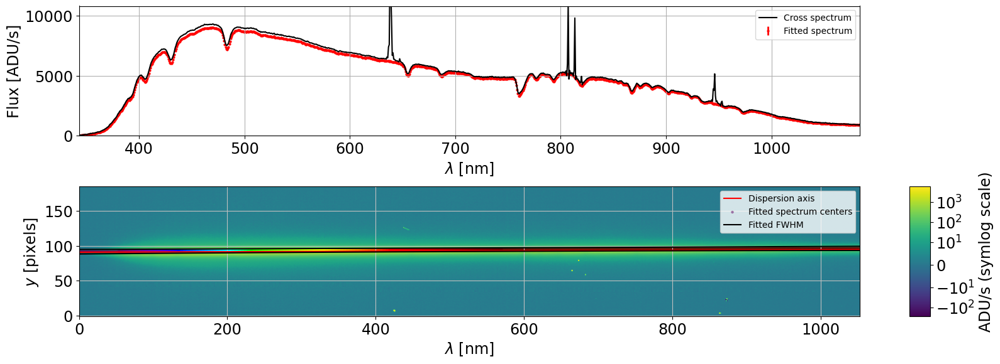

2023-09-21 13:32:57  spectractor.extractor.extractor SpectractorRun       INFO   
	Calibrating order 1 spectrum...


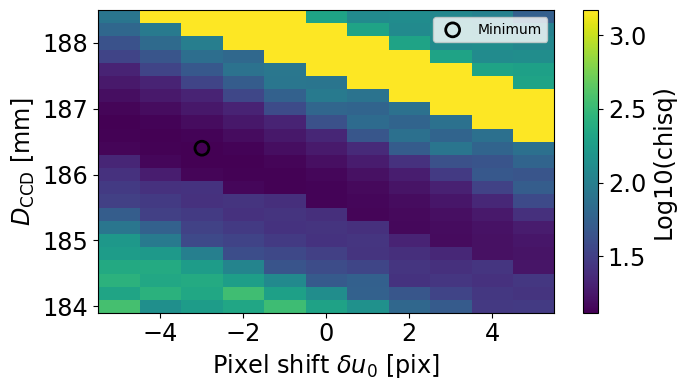

2023-09-21 13:33:03  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: -2.000pix
	D = 186.171 mm (default: DISTANCE2CCD = 186.00 +/- 0.40 mm, 0.4 sigma shift)


2023-09-21 13:33:03  spectractor.extractor.extractor SpectractorRun       INFO   
	  ======================= FFM DECONVOLUTION =============================


2023-09-21 13:33:03  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.


2023-09-21 13:33:04  FullForwardModelFitWorkspace __init__             INFO   
	Full forward model fitting with regularisation parameter r=0.1.


2023-09-21 13:33:04  spectractor.extractor.extractor run_ffm_minimisation INFO   
	Start FFM with adjust_spectrogram_position_parameters.


2023-09-21 13:33:06  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	initial cost=1.0984e+07	initial chisq_red=417.24


2023-09-21 13:33:10  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	final cost=1.0951e+07	final chisq_red=415.98 	computed in 5.39s


2023-09-21 13:33:16  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1:	final cost=1.0947e+07	final chisq_red=415.84 	computed in 5.35s


2023-09-21 13:33:16  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 1 iterations because the relative change of cost is below ftol=0.01.


2023-09-21 13:33:16  FullForwardModelFitWorkspace run_gradient_descent INFO   
	A2: 1.0 (fixed)
	D_CCD [mm]: 186.1711352394673 (fixed)
	shift_x [pix]: -2.0 (fixed)
	shift_y [pix]: 0.187 +0.001 -0.001
	angle [deg]: 0.18783 +8e-05 -8e-05
	B: 1.0 (fixed)
	R: 235.28708313616298 (fixed)
	P [hPa]: 743.2999877929688 (fixed)
	T [Celsius]: 14.550000190734863 (fixed)
	z: 1.06085572009565 (fixed)
	x_c_0: 1005.1448480927088 (fixed)
	x_c_1: 525.9967954279977 (fixed)
	x_c_2: 4.626868485664521e-13 (fixed)
	y_c_0: 0.0 (fixed)
	y_c_1: 0.0 (fixed)
	y_c_2: 0.0 (fixed)
	gamma_0: 3.8981247049126355 (fixed)
	gamma_1: -0.5817330696032331 (fixed)
	gamma_2: 0.8117835283345433 (fixed)
	alpha_0: 1.7674437428041998 (fixed)
	alpha_1: -0.25782615274005855 (fixed)
	alpha_2: 0.15891544768976476 (fixed)
	saturation_0: 22666.666666666668 (fixed)
	x_c_0_2: 1005.1448480927088 (fixed)
	x_c_1_2: 525.9967954279977 (fixed)
	x_c_2_2: 4.626868485664521e-13 (fixed)
	y_c_0_2: 0.0 (fixed)
	y_c_1_2: 0.0 (fixed)
	y_c_2_2: 0.0 (fixe

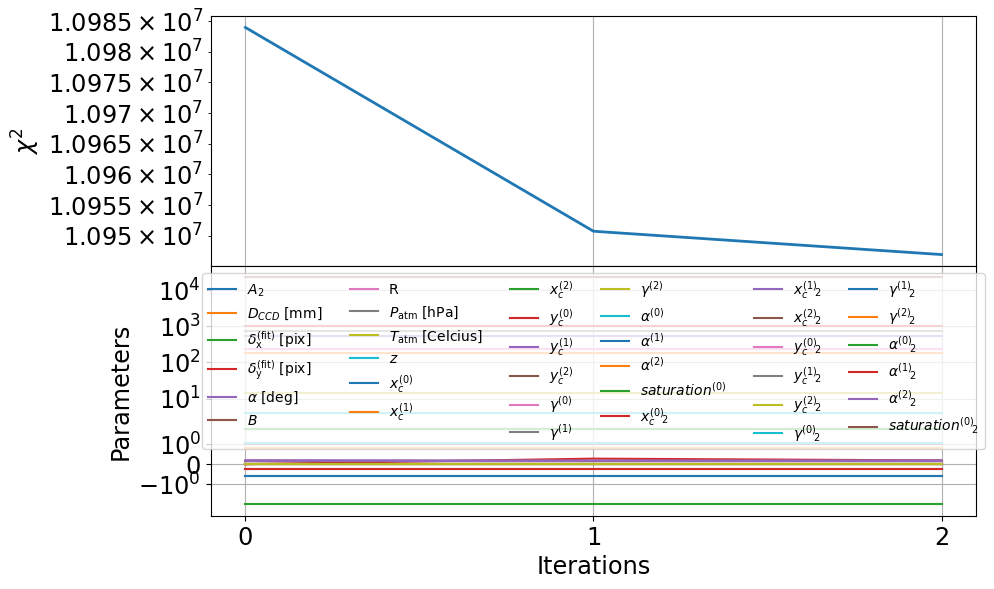

2023-09-21 13:33:18  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:33:19  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


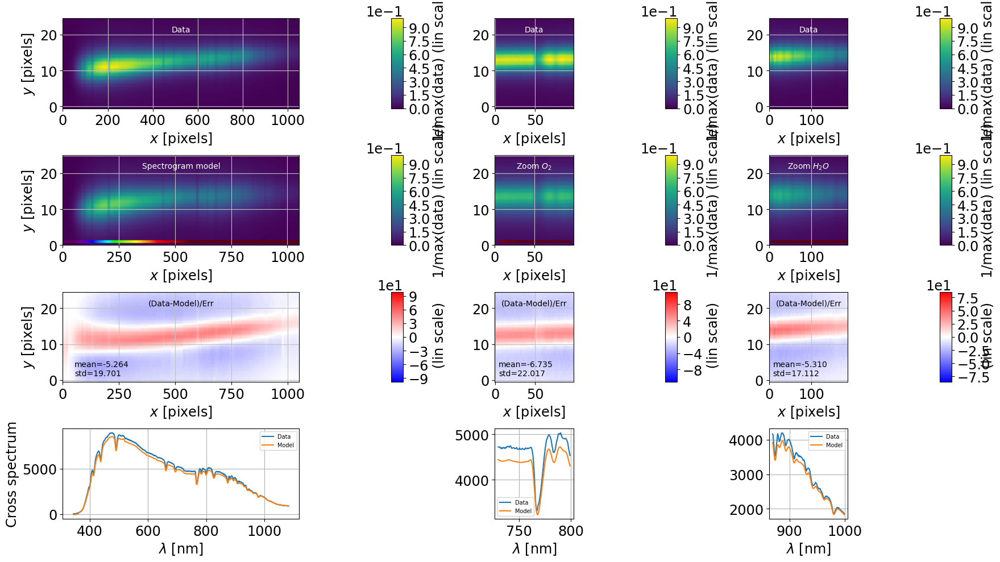

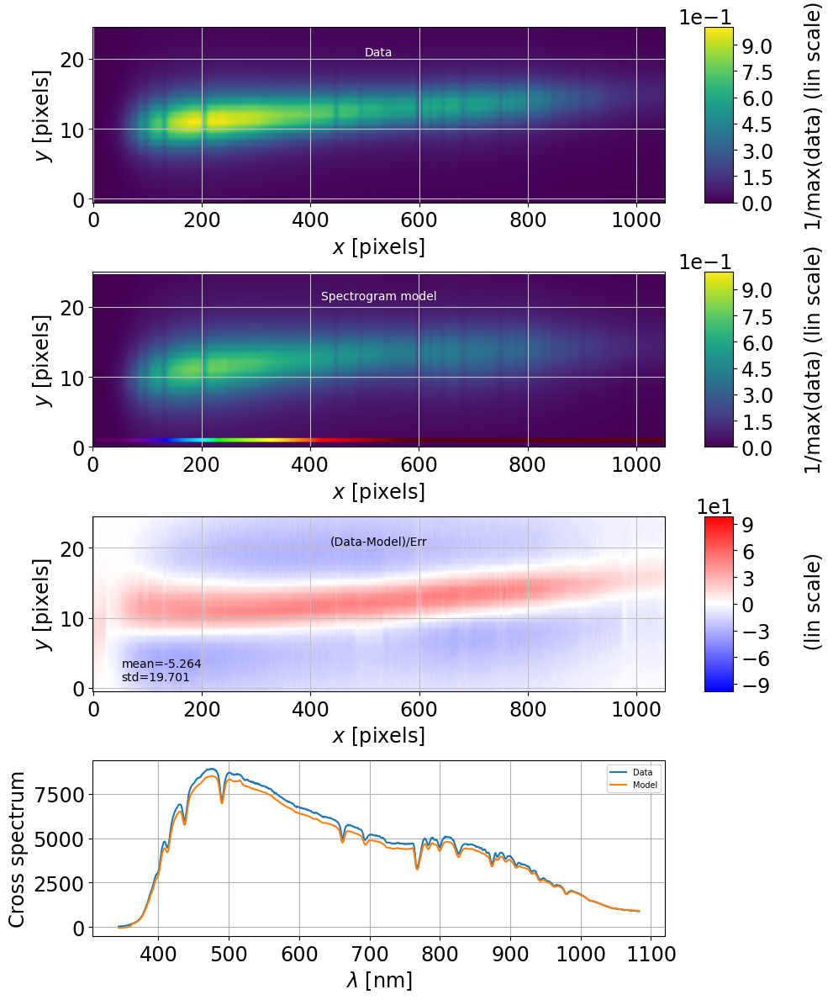

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:470: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


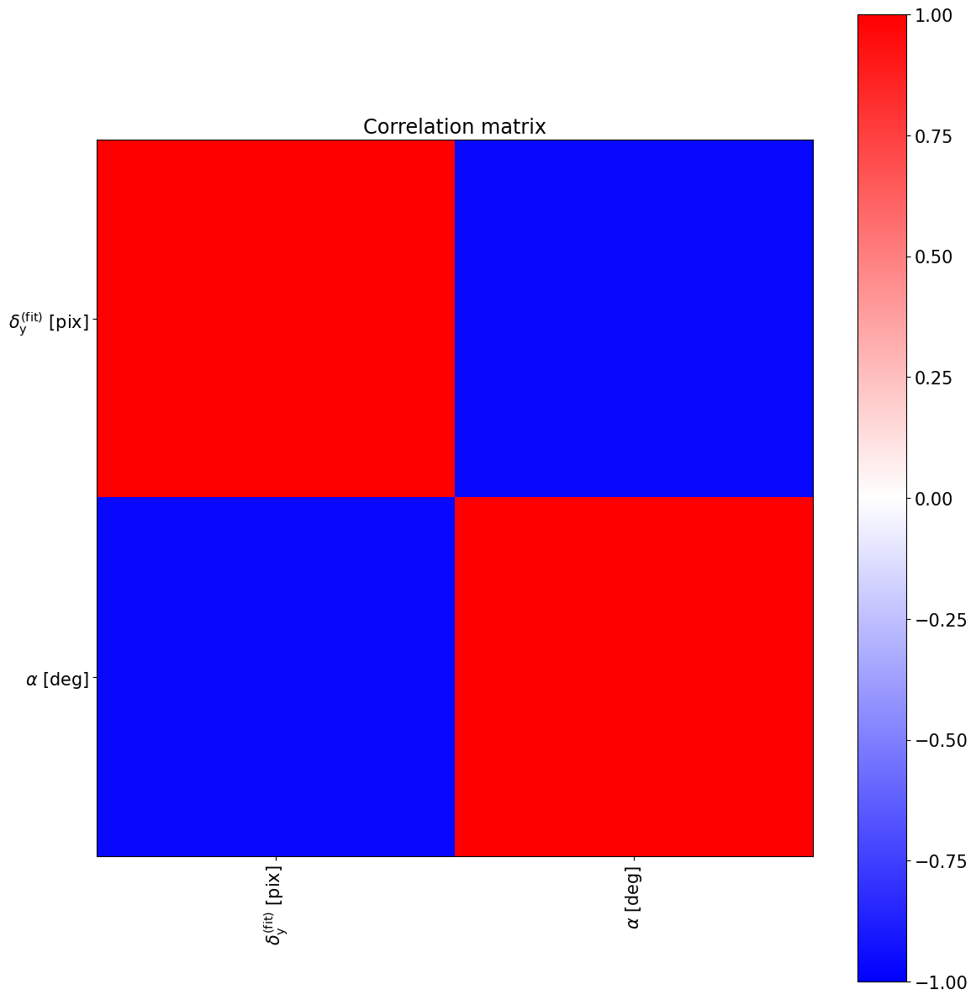

2023-09-21 13:33:21  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.


2023-09-21 13:33:23  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:33:24  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


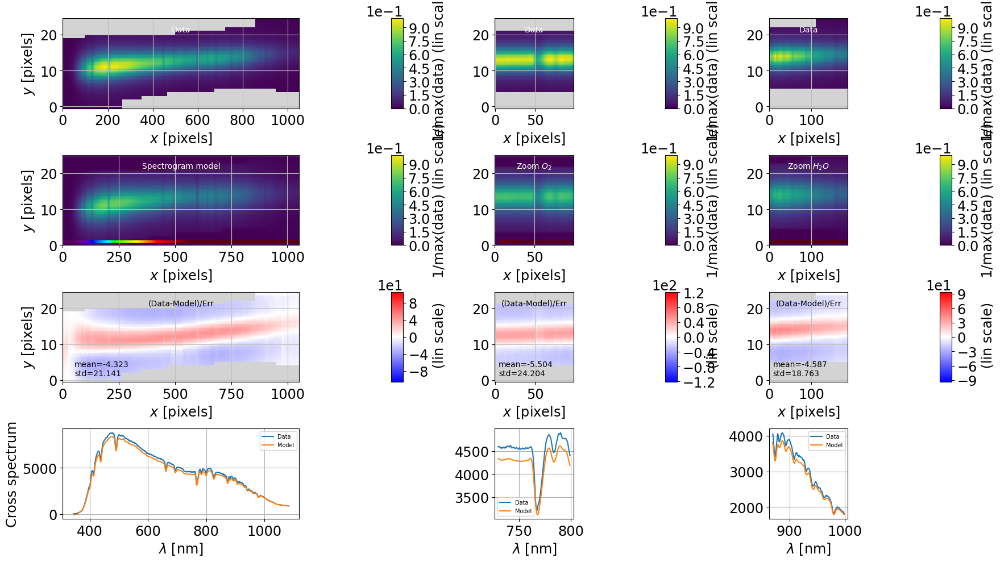

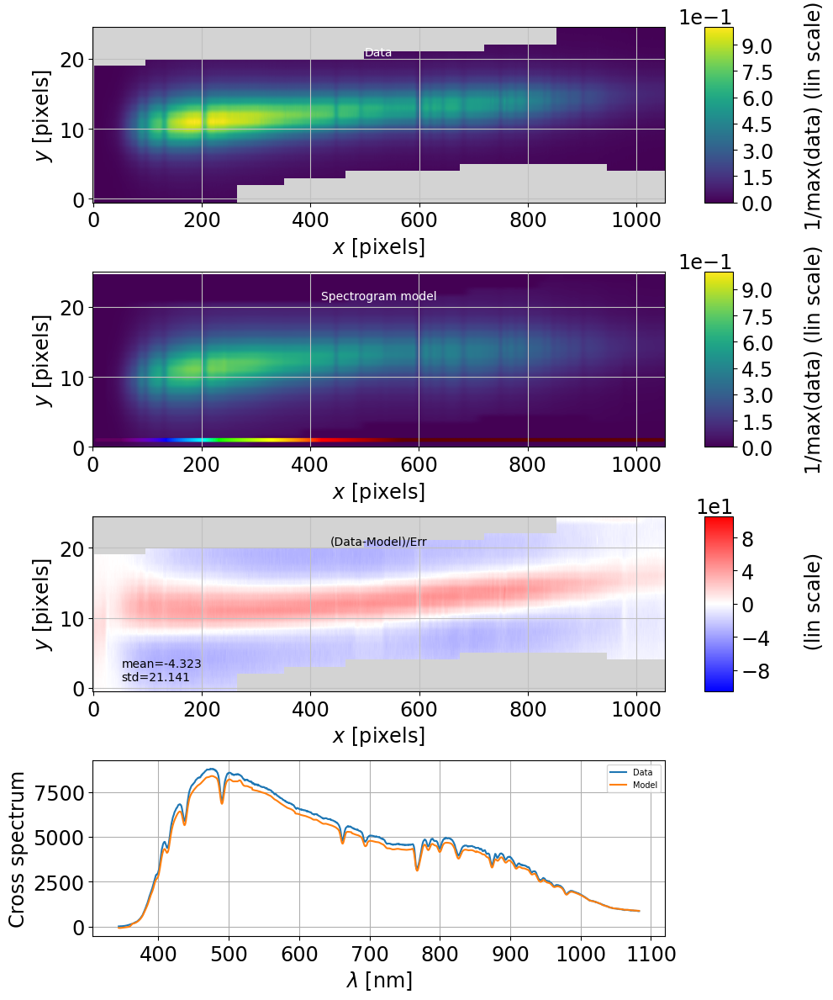

2023-09-21 13:33:26  spectractor.extractor.extractor run_ffm_minimisation INFO   	Start guess:
	A2: 1.0 (fixed=True)
	D_CCD [mm]: 186.1711352394673 (fixed=True)
	shift_x [pix]: -2.0 (fixed=True)
	shift_y [pix]: 0.186667371680304 (fixed=True)
	angle [deg]: 0.18783146204251466 (fixed=True)
	B: 1.0 (fixed=True)
	R: 235.28708313616298 (fixed=True)
	P [hPa]: 743.2999877929688 (fixed=True)
	T [Celsius]: 14.550000190734863 (fixed=True)
	z: 1.06085572009565 (fixed=True)
	x_c_0: 1005.1448480927088 (fixed=True)
	x_c_1: 525.9967954279977 (fixed=True)
	x_c_2: 4.626868485664521e-13 (fixed=True)
	y_c_0: 0.0 (fixed=False)
	y_c_1: 0.0 (fixed=False)
	y_c_2: 0.0 (fixed=False)
	gamma_0: 3.8981247049126355 (fixed=False)
	gamma_1: -0.5817330696032331 (fixed=False)
	gamma_2: 0.8117835283345433 (fixed=False)
	alpha_0: 1.7674437428041998 (fixed=False)
	alpha_1: -0.25782615274005855 (fixed=False)
	alpha_2: 0.15891544768976476 (fixed=False)
	saturation_0: 22666.666666666668 (fixed=True)
	x_c_0_2: 1005.144848092

2023-09-21 13:33:26  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	initial cost=9.3955e+06	initial chisq_red=465.63


2023-09-21 13:33:41  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	final cost=9.2474e+05	final chisq_red=45.829 	computed in 15.00s


2023-09-21 13:33:56  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1:	final cost=2.6927e+05	final chisq_red=13.345 	computed in 15.05s


2023-09-21 13:34:11  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=2:	final cost=1.3644e+05	final chisq_red=6.762 	computed in 15.04s


2023-09-21 13:34:26  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=3:	final cost=1.1067e+05	final chisq_red=5.4846 	computed in 15.03s


2023-09-21 13:34:41  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=4:	final cost=99067	final chisq_red=4.9097 	computed in 15.05s


2023-09-21 13:34:56  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=5:	final cost=96747	final chisq_red=4.7947 	computed in 15.02s


2023-09-21 13:35:11  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=6:	final cost=96054	final chisq_red=4.7603 	computed in 14.98s


2023-09-21 13:35:11  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 6 iterations because the relative change of cost is below ftol=0.01.


2023-09-21 13:35:11  FullForwardModelFitWorkspace run_gradient_descent INFO   
	A2: 1.0 (fixed)
	D_CCD [mm]: 186.1711352394673 (fixed)
	shift_x [pix]: -2.0 (fixed)
	shift_y [pix]: 0.186667371680304 (fixed)
	angle [deg]: 0.18783146204251466 (fixed)
	B: 1.0 (fixed)
	R: 235.28708313616298 (fixed)
	P [hPa]: 743.2999877929688 (fixed)
	T [Celsius]: 14.550000190734863 (fixed)
	z: 1.06085572009565 (fixed)
	x_c_0: 1005.1448480927088 (fixed)
	x_c_1: 525.9967954279977 (fixed)
	x_c_2: 4.626868485664521e-13 (fixed)
	y_c_0: 0.081 +0.002 -0.002
	y_c_1: 0.047 +0.003 -0.003
	y_c_2: 0.896 +0.002 -0.002
	gamma_0: 3.457 +0.003 -0.003
	gamma_1: -1.466 +0.006 -0.006
	gamma_2: -0.071 +0.007 -0.007
	alpha_0: 2.046 +0.002 -0.002
	alpha_1: -0.686 +0.003 -0.003
	alpha_2: -0.324 +0.004 -0.004
	saturation_0: 22666.666666666668 (fixed)
	x_c_0_2: 1005.1448480927088 (fixed)
	x_c_1_2: 525.9967954279977 (fixed)
	x_c_2_2: 4.626868485664521e-13 (fixed)
	y_c_0_2: 9.90 +0.08 -0.08
	y_c_1_2: 16.3 +0.1 -0.1
	y_c_2_2: 8.33 +0

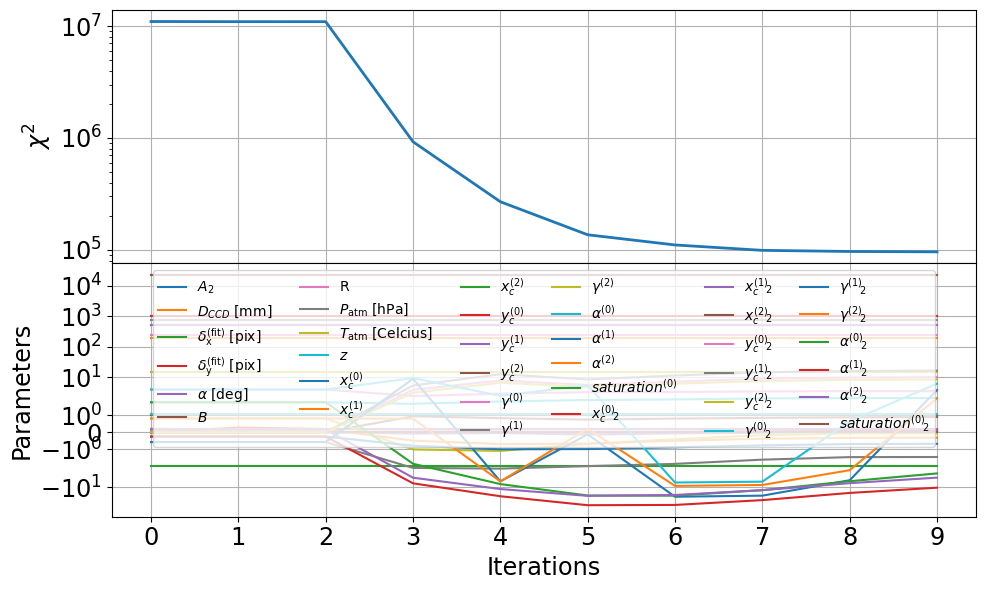

2023-09-21 13:35:13  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:35:14  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


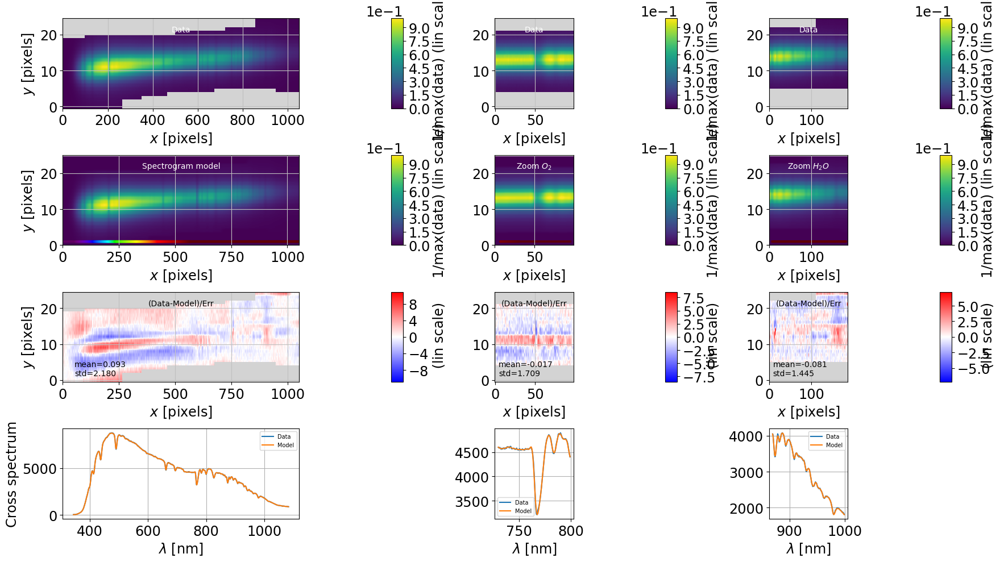

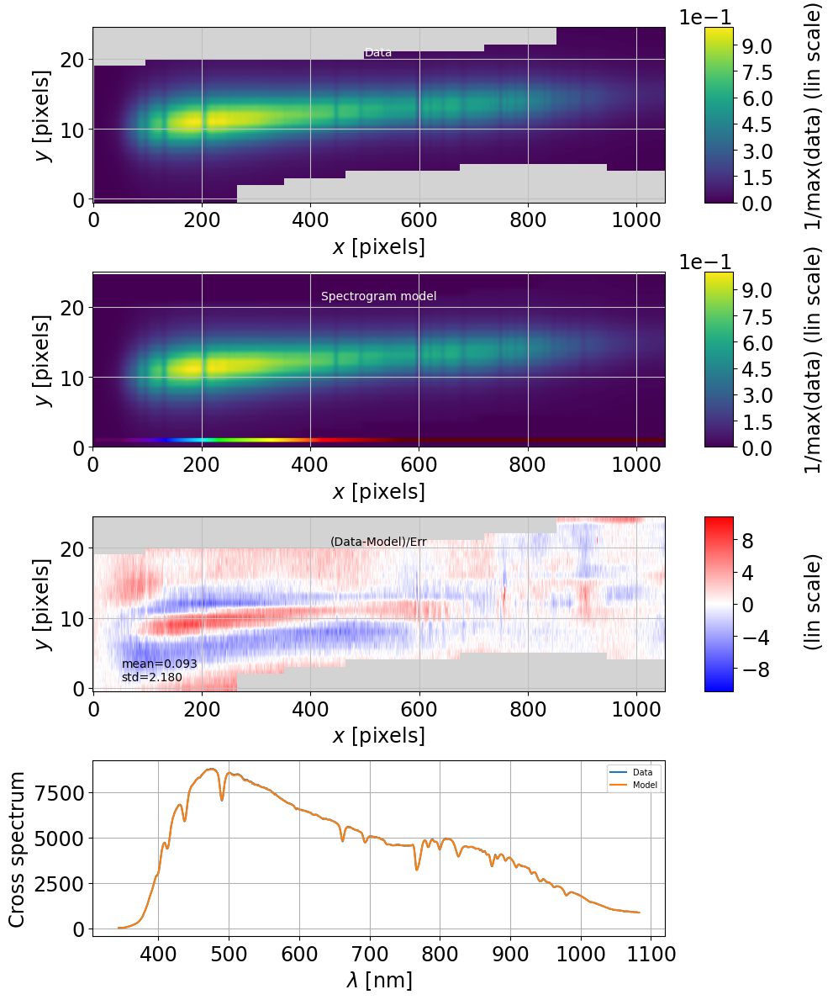

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:470: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


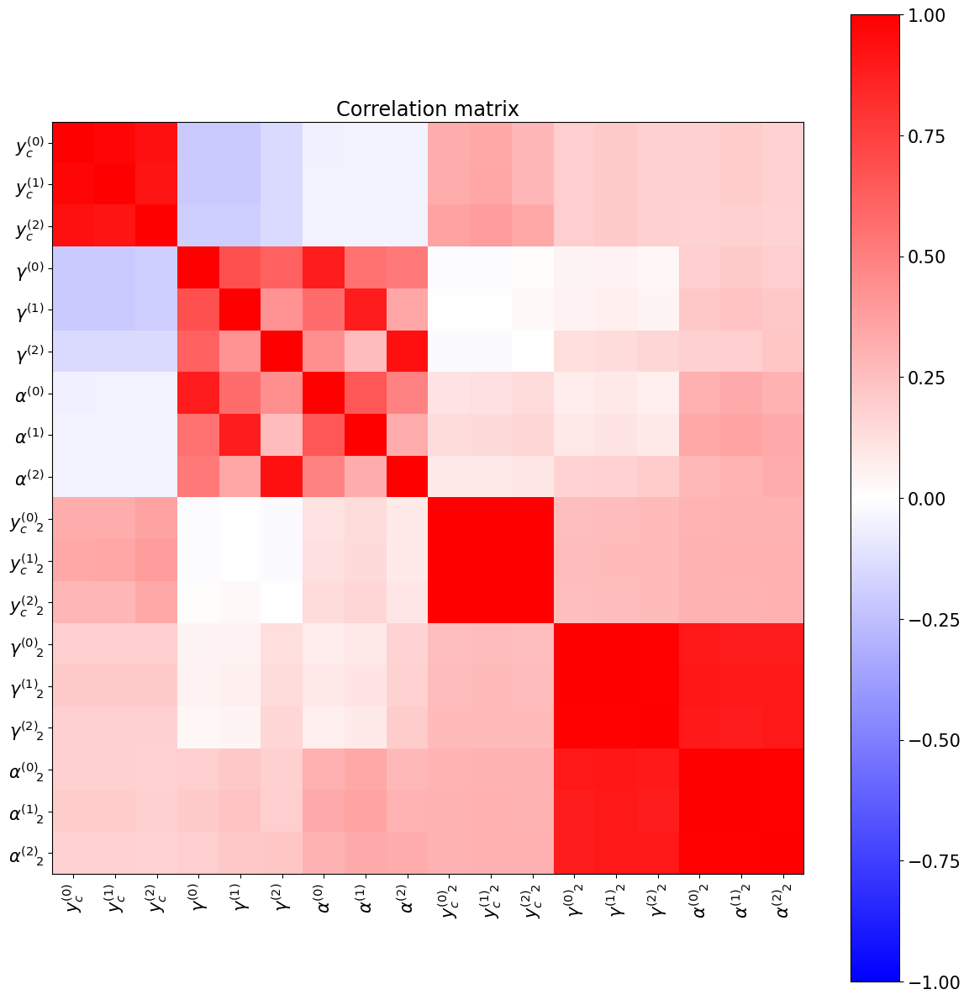

2023-09-21 13:35:17  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:35:18  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


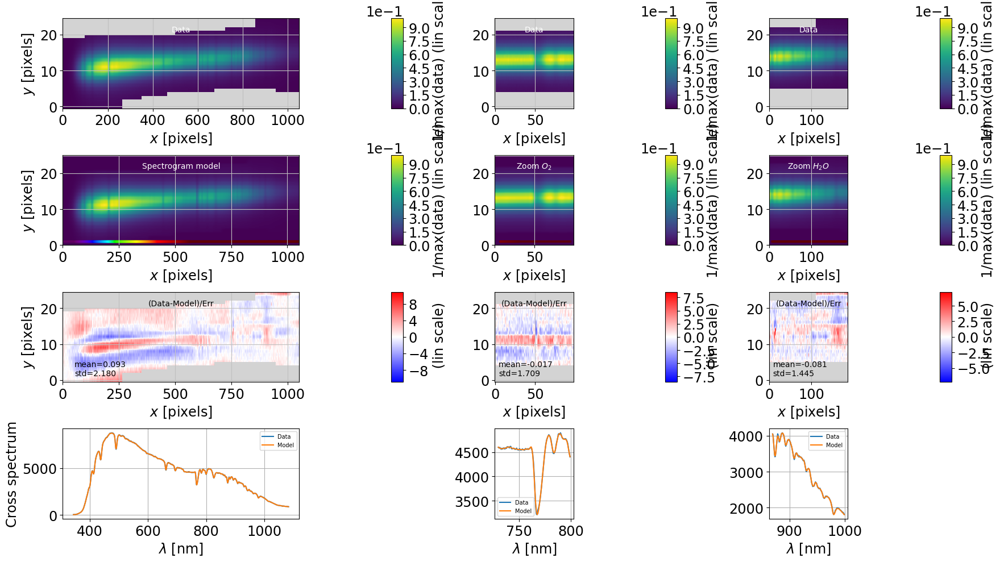

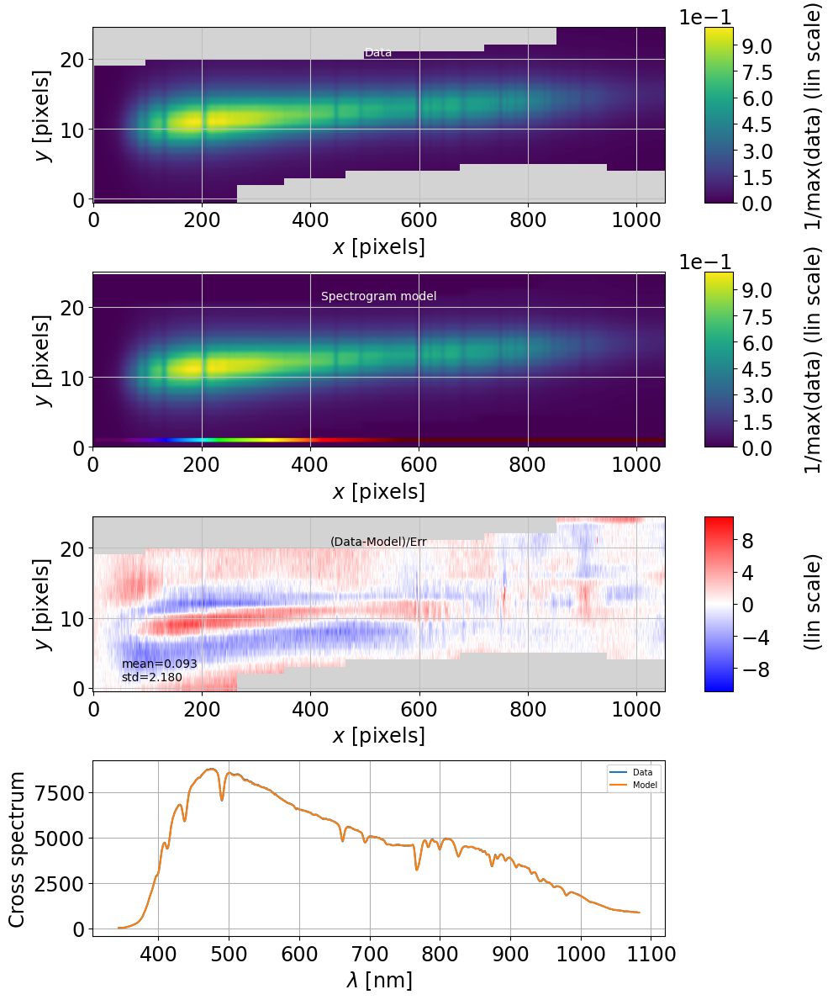

2023-09-21 13:35:20  spectractor.extractor.extractor run_ffm_minimisation INFO   
	Mean FWHM: 5.395581167338192 pixels (weighted with spectrum amplitude)


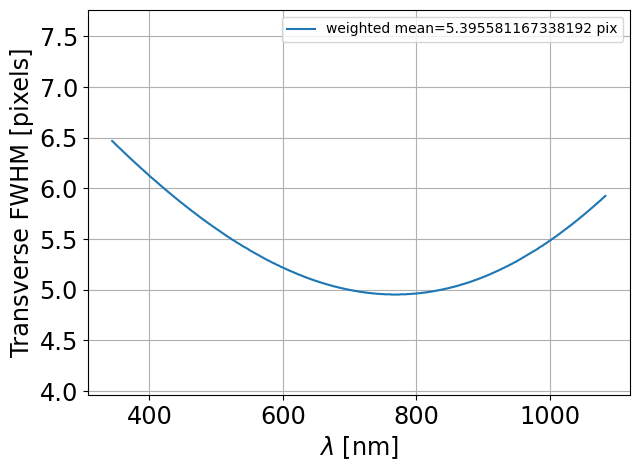

2023-09-21 13:35:20  spectractor.extractor.extractor run_ffm_minimisation INFO   
	Start regularization parameter only.
/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:1772: OptimizeWarning: Unknown solver options: ftol
  result = optimize.minimize(nll, fit_workspace.params.values, method=minimizer_method,


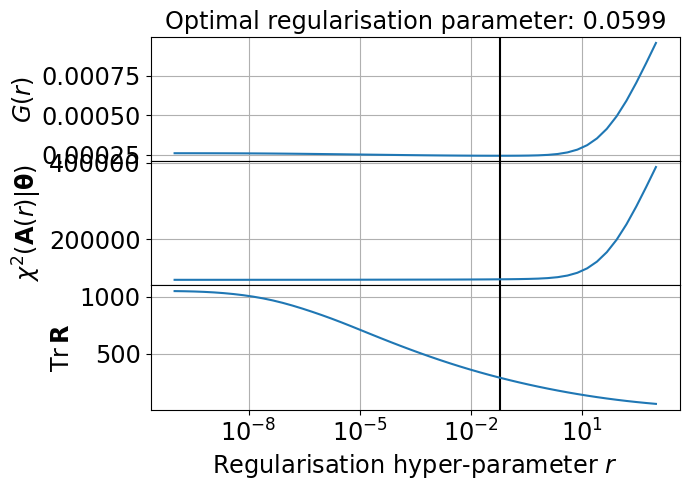

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:2029: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


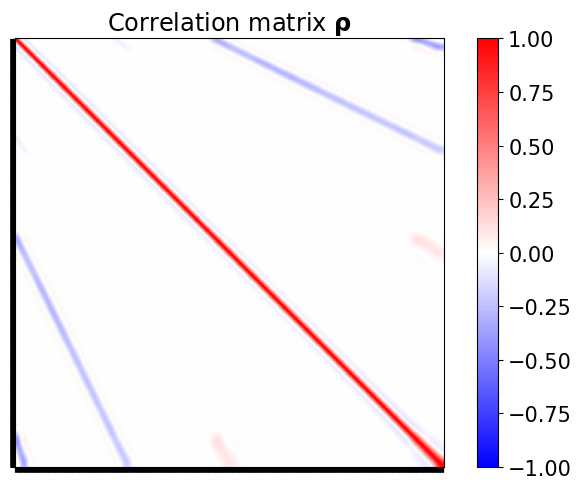

2023-09-21 13:35:33  RegFitWorkspace print_regularisation_summary INFO   
	Optimal regularisation parameter: 0.059861616110159915
	Tr(R) = 288.5731235014165
	N_params = 1053
	N_data = 20178 (without mask and outliers)


2023-09-21 13:35:34  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:35:35  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


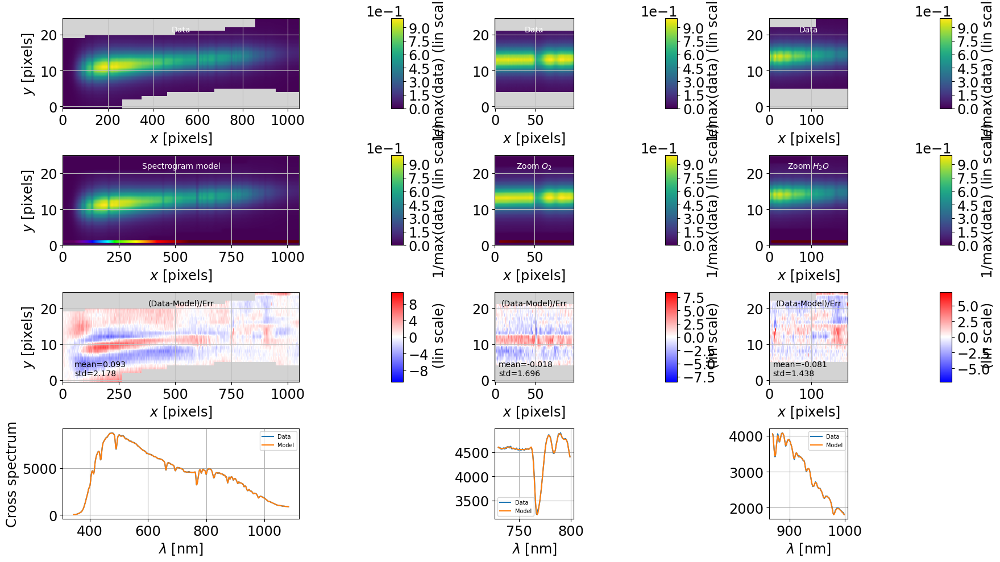

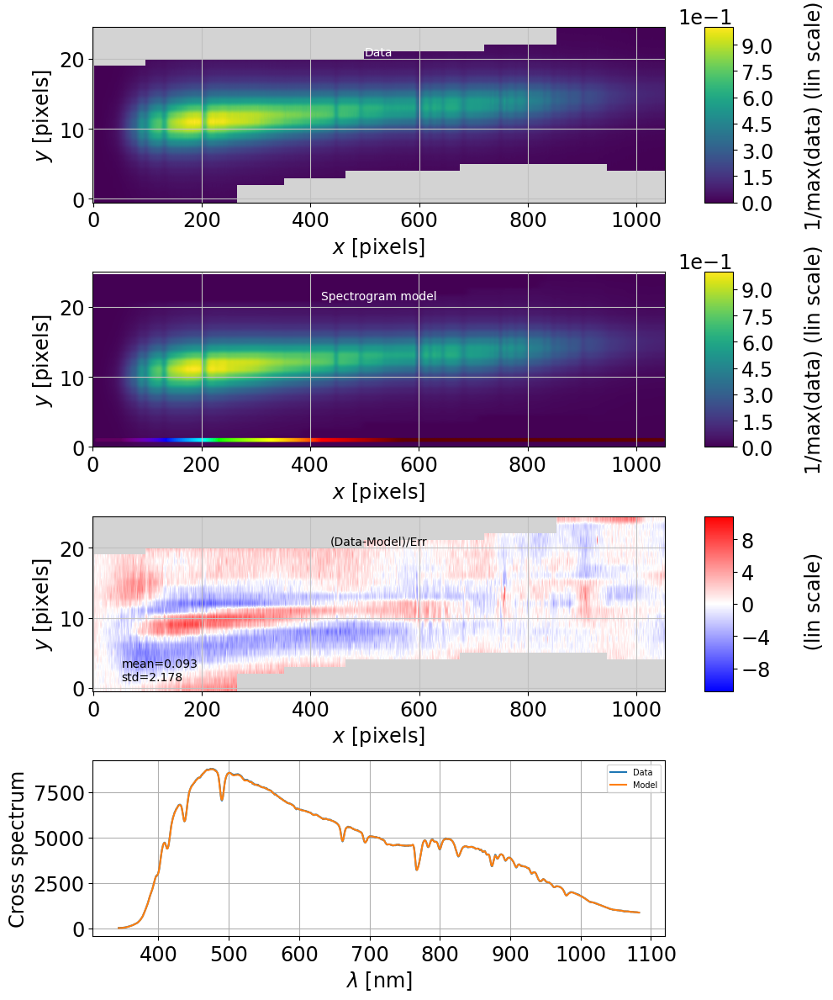

2023-09-21 13:35:37  spectractor.extractor.extractor run_ffm_minimisation INFO   
	Start run_minimisation_sigma_clipping with sigma=100.


2023-09-21 13:35:37  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.


2023-09-21 13:35:38  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	Sigma-clipping step 0/3 (sigma=100)


2023-09-21 13:35:39  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	initial cost=91160	initial chisq_red=4.7954


2023-09-21 13:35:50  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	final cost=90030	final chisq_red=4.7359 	computed in 12.28s


2023-09-21 13:36:02  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1:	final cost=90023	final chisq_red=4.7356 	computed in 12.24s


2023-09-21 13:36:02  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 1 iterations because the relative change of cost is below ftol=0.001.


2023-09-21 13:36:02  FullForwardModelFitWorkspace run_gradient_descent INFO   
	A2: 1.0 (fixed)
	D_CCD [mm]: 186.1711352394673 (fixed)
	shift_x [pix]: -2.0 (fixed)
	shift_y [pix]: 0.186667371680304 (fixed)
	angle [deg]: 0.18783146204251466 (fixed)
	B: 1.0 (fixed)
	R: 235.28708313616298 (fixed)
	P [hPa]: 743.2999877929688 (fixed)
	T [Celsius]: 14.550000190734863 (fixed)
	z: 1.06085572009565 (fixed)
	x_c_0: 1005.1448480927088 (fixed)
	x_c_1: 525.9967954279977 (fixed)
	x_c_2: 4.626868485664521e-13 (fixed)
	y_c_0: 0.080 +0.002 -0.002
	y_c_1: 0.047 +0.003 -0.003
	y_c_2: 0.895 +0.002 -0.002
	gamma_0: 3.495 +0.004 -0.004
	gamma_1: -1.530 +0.007 -0.007
	gamma_2: -0.019 +0.008 -0.008
	alpha_0: 2.067 +0.002 -0.002
	alpha_1: -0.729 +0.004 -0.004
	alpha_2: -0.299 +0.004 -0.004
	saturation_0: 22666.666666666668 (fixed)
	x_c_0_2: 1005.1448480927088 (fixed)
	x_c_1_2: 525.9967954279977 (fixed)
	x_c_2_2: 4.626868485664521e-13 (fixed)
	y_c_0_2: 9.72 +0.08 -0.08
	y_c_1_2: 16.0 +0.1 -0.1
	y_c_2_2: 8.19 +0

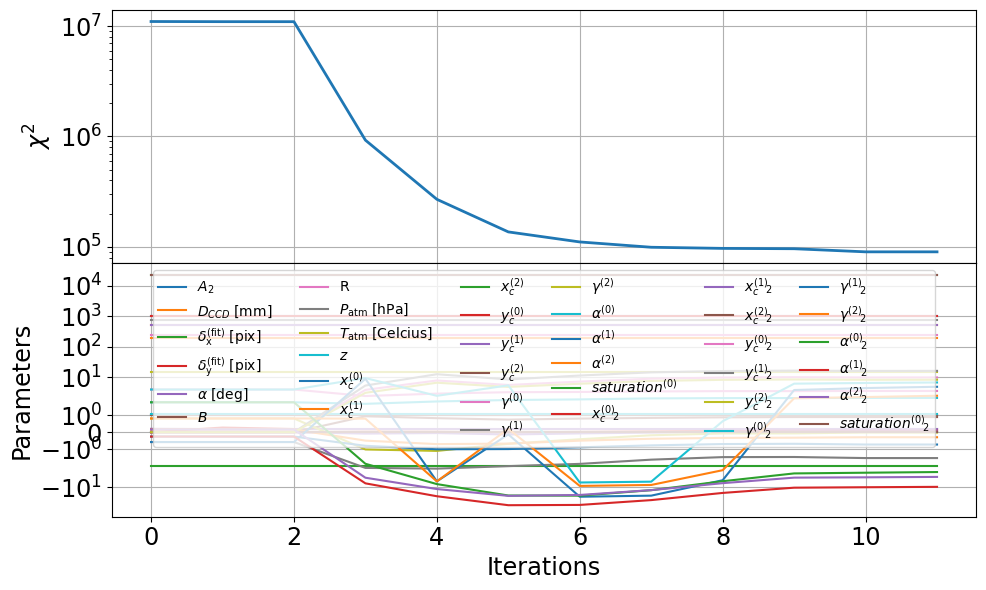

2023-09-21 13:36:04  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:36:05  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


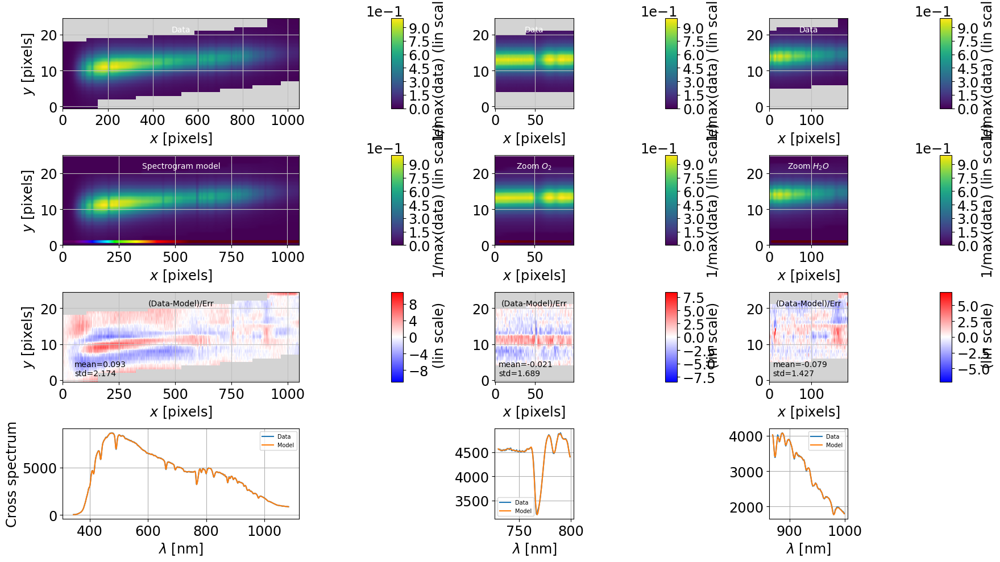

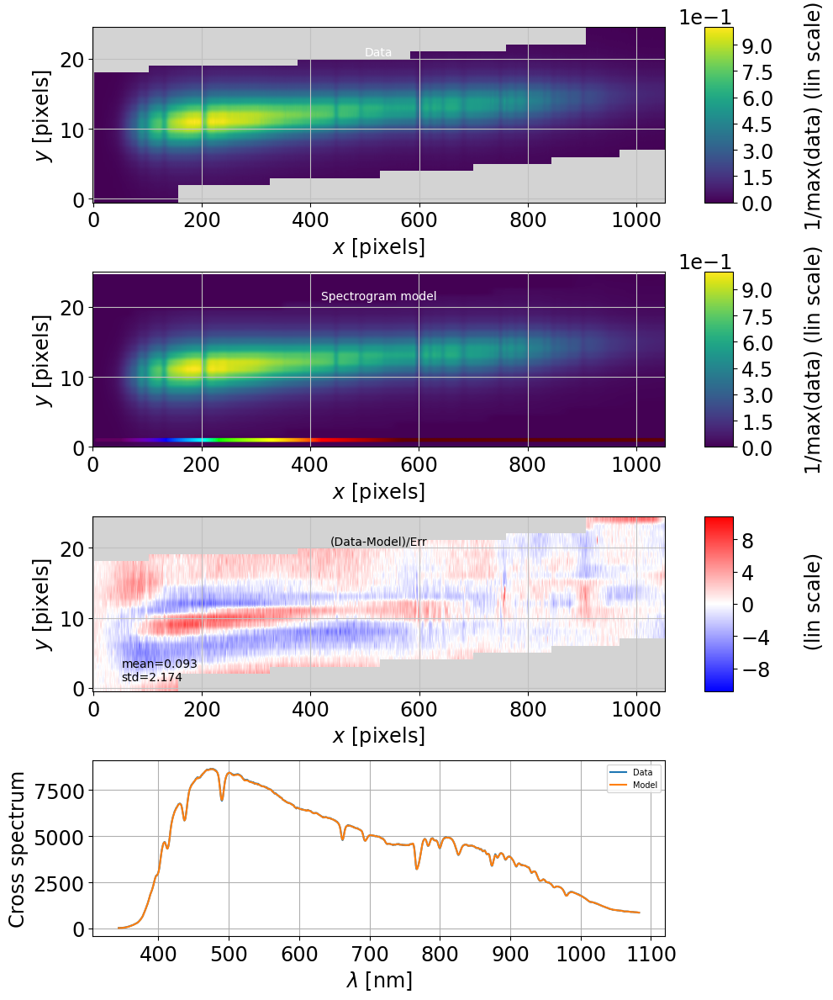

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:470: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


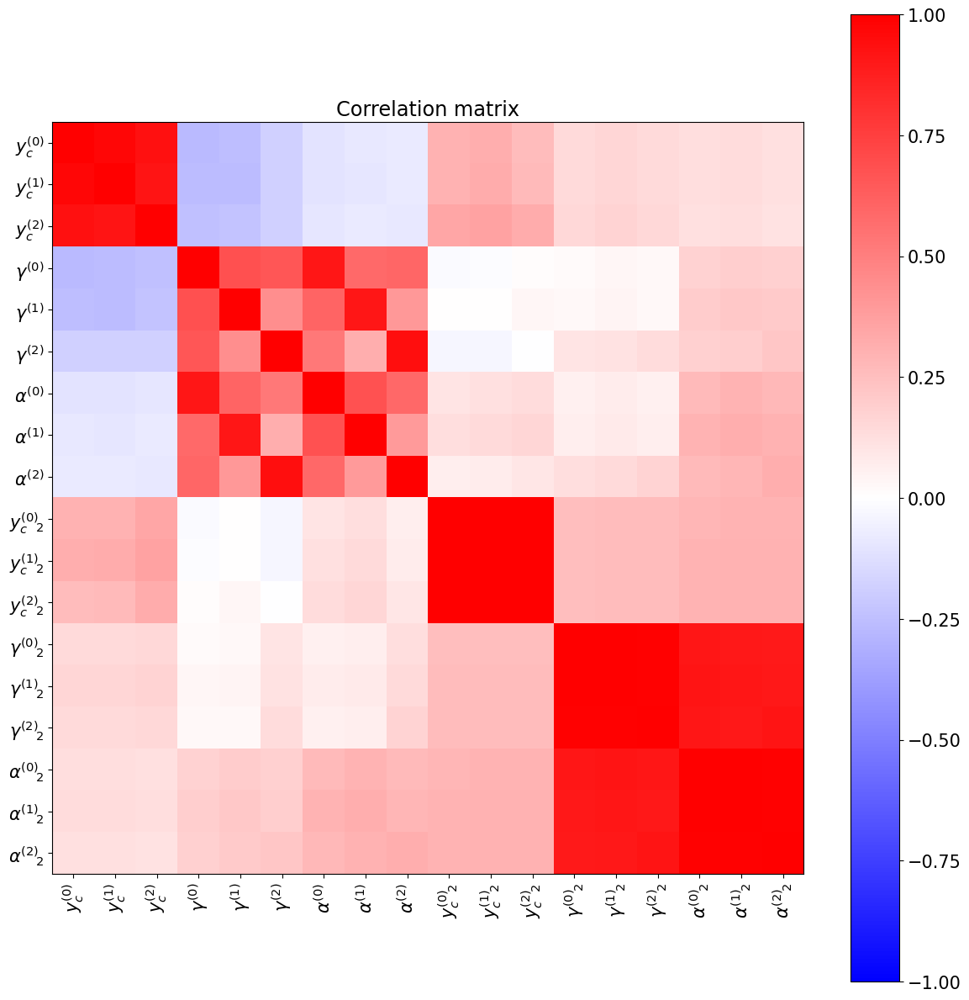

2023-09-21 13:36:08  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	No outliers detected at first iteration: break the sigma clipping iterations.


2023-09-21 13:36:08  spectractor.extractor.extractor run_ffm_minimisation INFO   
	  niter = 0 : Newton: total computation time: 162.13132452964783s


2023-09-21 13:36:08  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:36:09  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


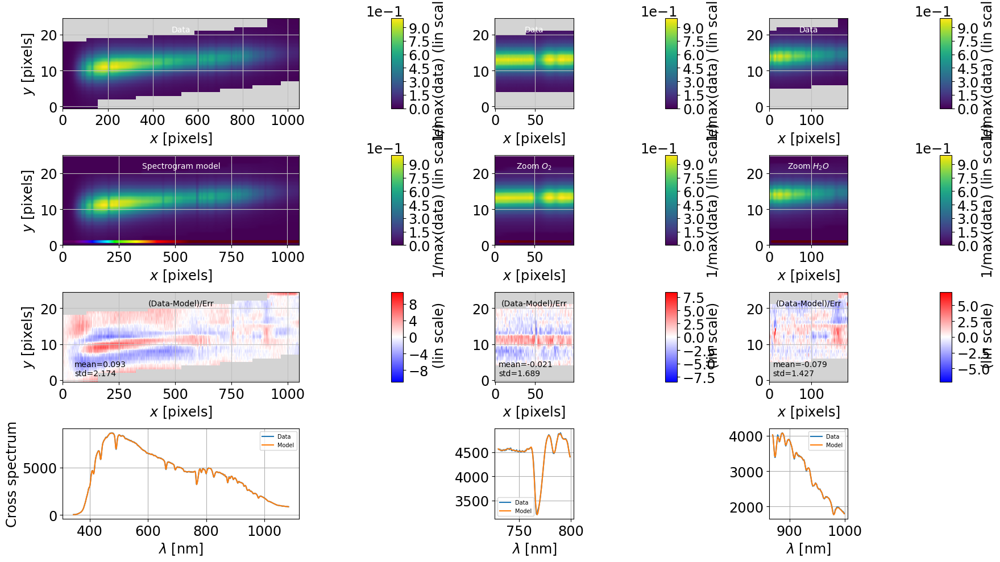

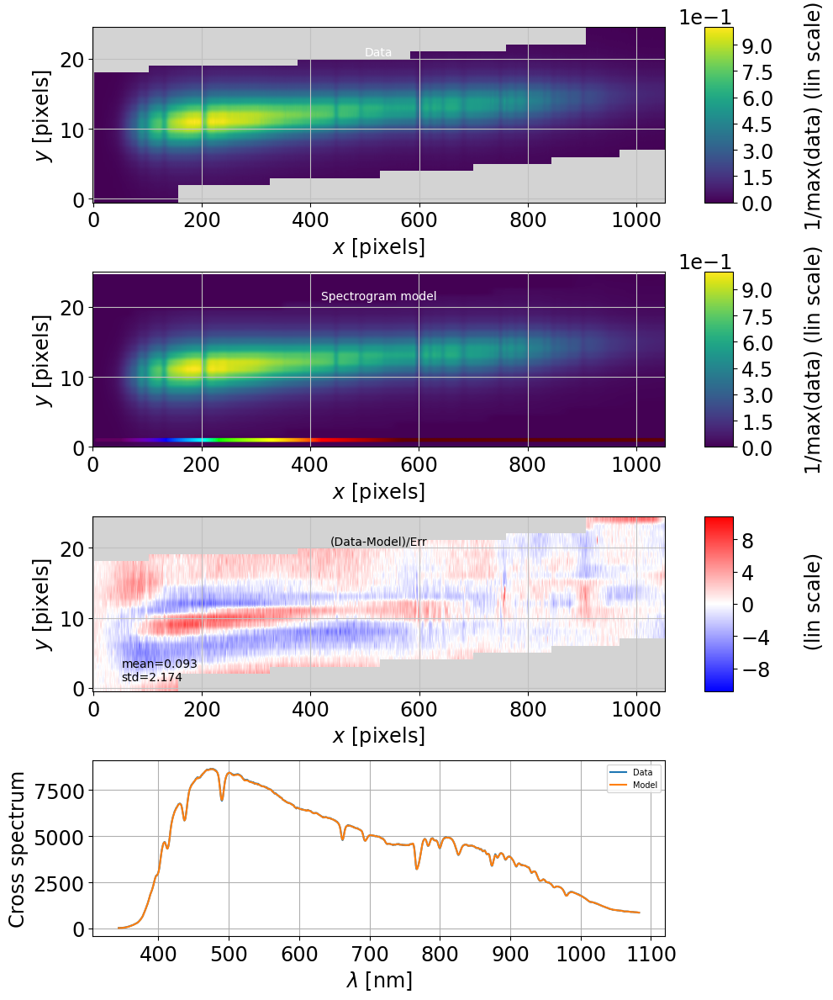

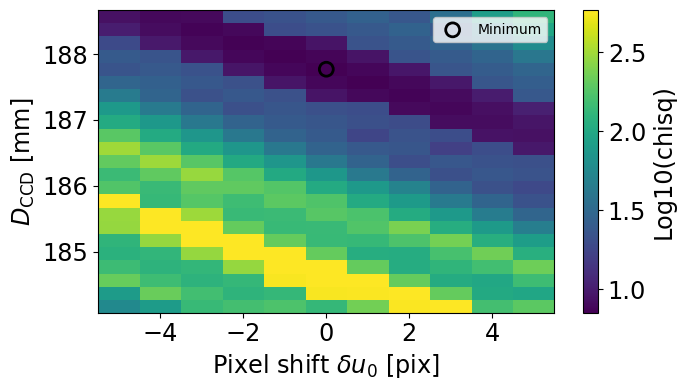

2023-09-21 13:36:19  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: -0.377pix
	D = 187.856 mm (default: DISTANCE2CCD = 186.00 +/- 0.40 mm, 4.6 sigma shift)


2023-09-21 13:36:19  FullForwardModelFitWorkspace set_mask             INFO   
	Reset spectrogram mask with current parameters.


2023-09-21 13:36:19  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	Sigma-clipping step 0/3 (sigma=100)


2023-09-21 13:36:20  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	initial cost=1.3229e+05	initial chisq_red=6.9479


2023-09-21 13:36:32  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=0:	final cost=93915	final chisq_red=4.9325 	computed in 12.30s


2023-09-21 13:36:44  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=1:	final cost=92122	final chisq_red=4.8384 	computed in 12.22s


2023-09-21 13:36:56  spectractor.fit.fitter gradient_descent     INFO   
	Iteration=2:	final cost=92118	final chisq_red=4.8381 	computed in 12.19s


2023-09-21 13:36:56  spectractor.fit.fitter gradient_descent     INFO   
	Gradient descent terminated in 2 iterations because the relative change of cost is below ftol=0.001.


2023-09-21 13:36:56  FullForwardModelFitWorkspace run_gradient_descent INFO   
	A2: 1.0 (fixed)
	D_CCD [mm]: 187.3711352394673 (fixed)
	shift_x [pix]: -0.3770709129096085 (fixed)
	shift_y [pix]: 0.186667371680304 (fixed)
	angle [deg]: 0.18783146204251466 (fixed)
	B: 1.0 (fixed)
	R: 235.28708313616298 (fixed)
	P [hPa]: 743.2999877929688 (fixed)
	T [Celsius]: 14.550000190734863 (fixed)
	z: 1.06085572009565 (fixed)
	x_c_0: 1005.1448480927088 (fixed)
	x_c_1: 525.9967954279977 (fixed)
	x_c_2: 4.626868485664521e-13 (fixed)
	y_c_0: 0.117 +0.002 -0.002
	y_c_1: 0.045 +0.003 -0.003
	y_c_2: 0.930 +0.002 -0.002
	gamma_0: 3.482 +0.004 -0.004
	gamma_1: -1.545 +0.007 -0.007
	gamma_2: -0.033 +0.008 -0.008
	alpha_0: 2.061 +0.002 -0.002
	alpha_1: -0.733 +0.004 -0.004
	alpha_2: -0.305 +0.004 -0.004
	saturation_0: 22666.666666666668 (fixed)
	x_c_0_2: 1005.1448480927088 (fixed)
	x_c_1_2: 525.9967954279977 (fixed)
	x_c_2_2: 4.626868485664521e-13 (fixed)
	y_c_0_2: 10.55 +0.07 -0.07
	y_c_1_2: 17.3 +0.1 -0.1
	

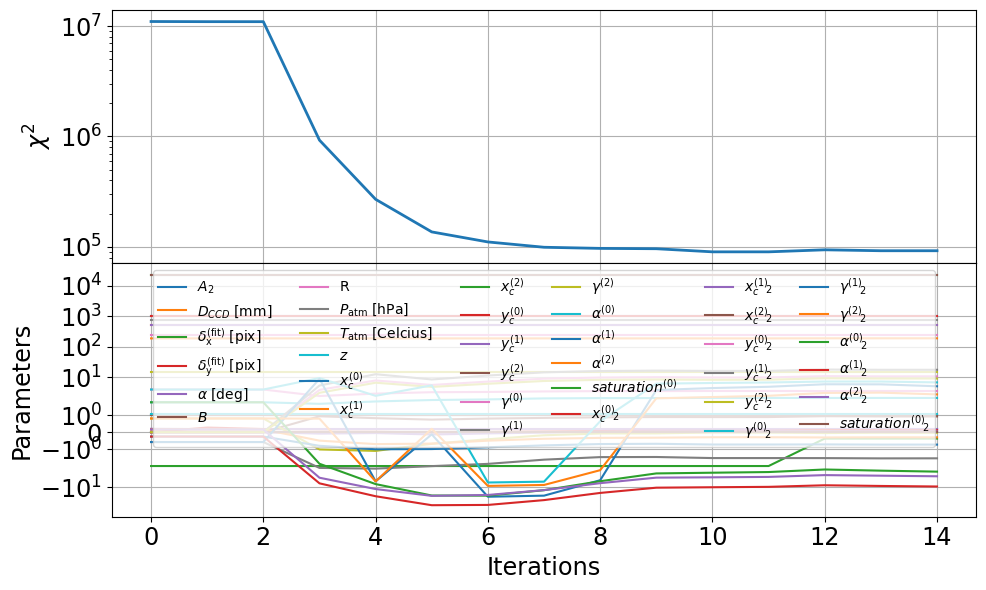

2023-09-21 13:36:58  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:36:59  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


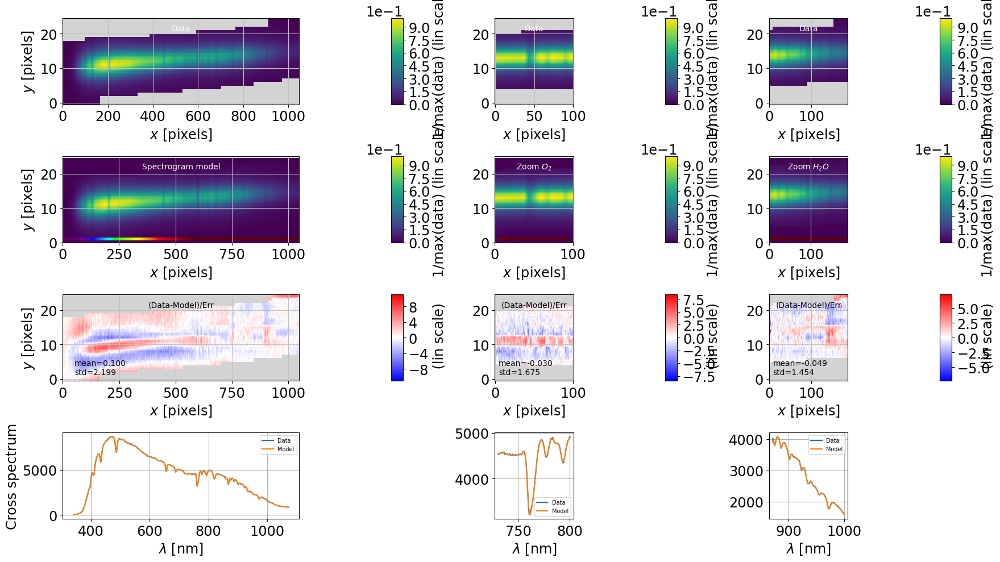

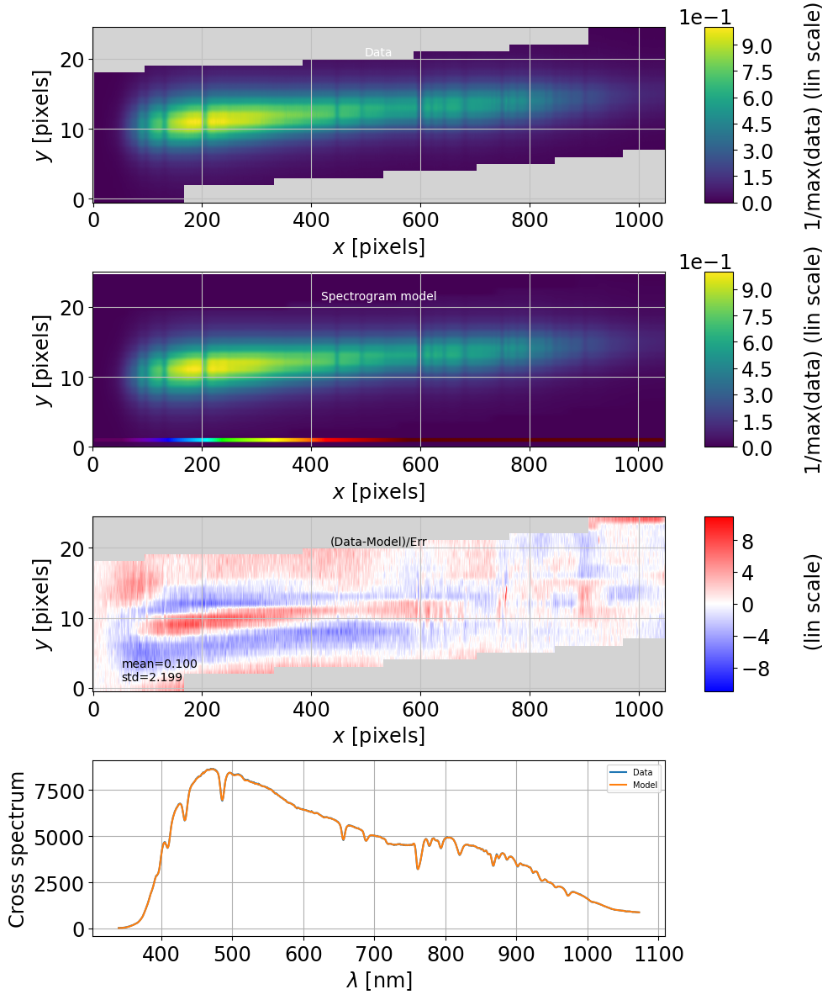

/home/d/dagoret/repos/repos_w_2023_35/Spectractor/lib/python/spectractor/fit/fitter.py:470: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


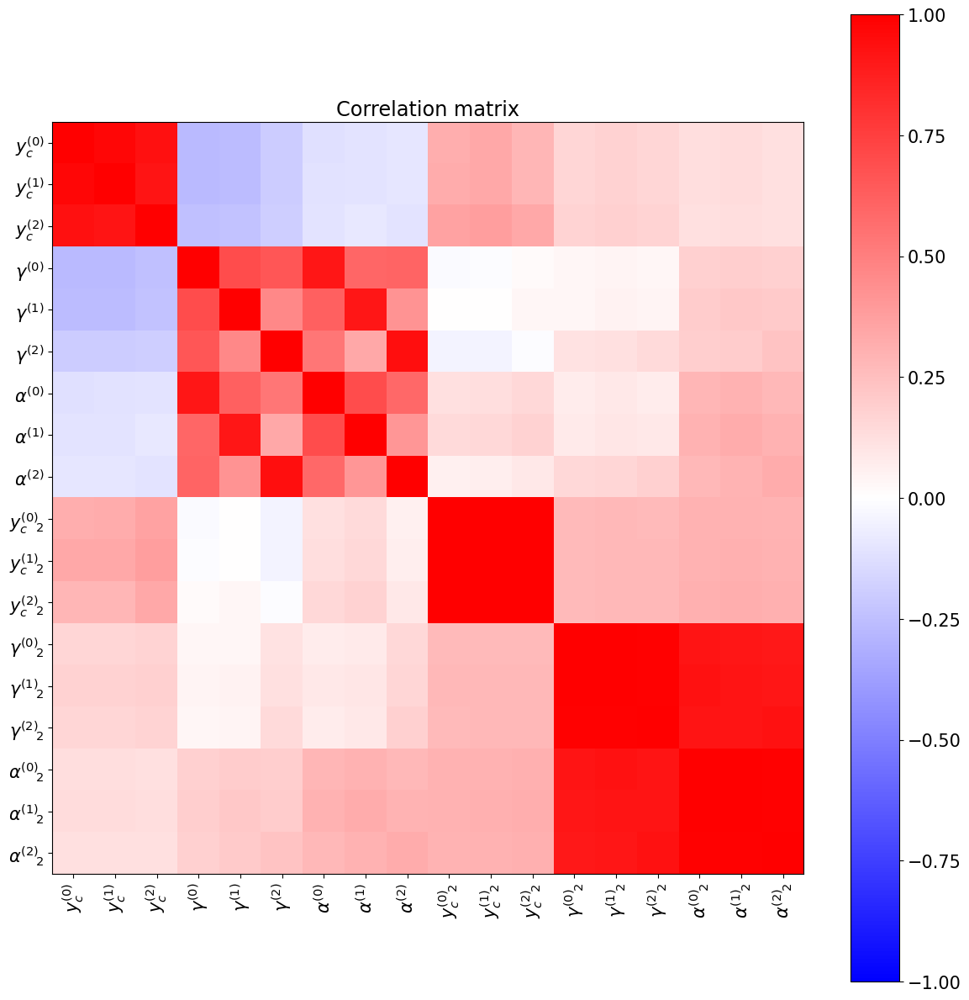

2023-09-21 13:37:02  spectractor.fit.fitter run_minimisation_sigma_clipping INFO   
	No outliers detected at first iteration: break the sigma clipping iterations.


2023-09-21 13:37:02  spectractor.extractor.extractor run_ffm_minimisation INFO   
	  niter = 1 : Newton: total computation time: 215.99097299575806s


2023-09-21 13:37:02  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf.


2023-09-21 13:37:03  FullForwardModelFitWorkspace plot_fit             INFO   
	Save figure ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf.


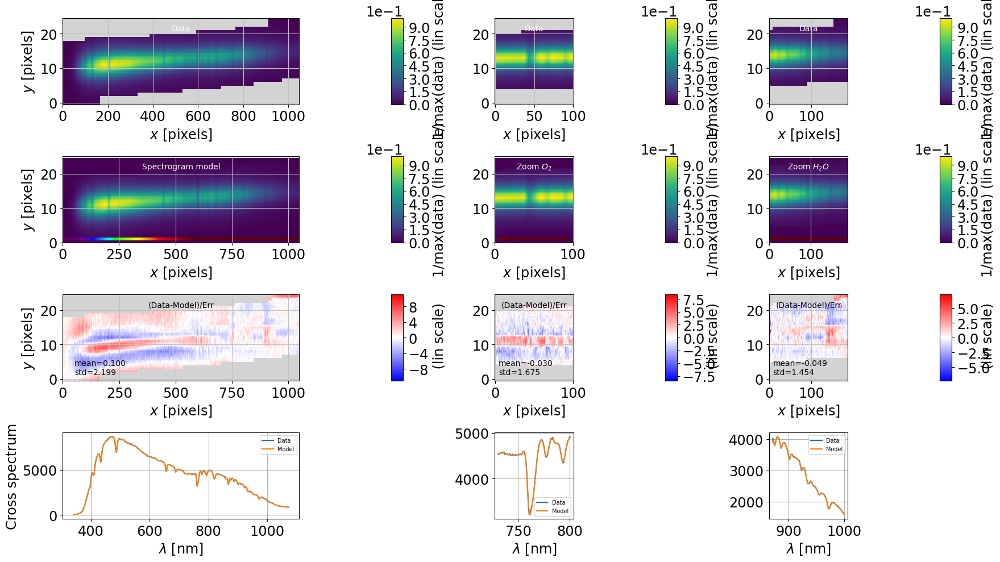

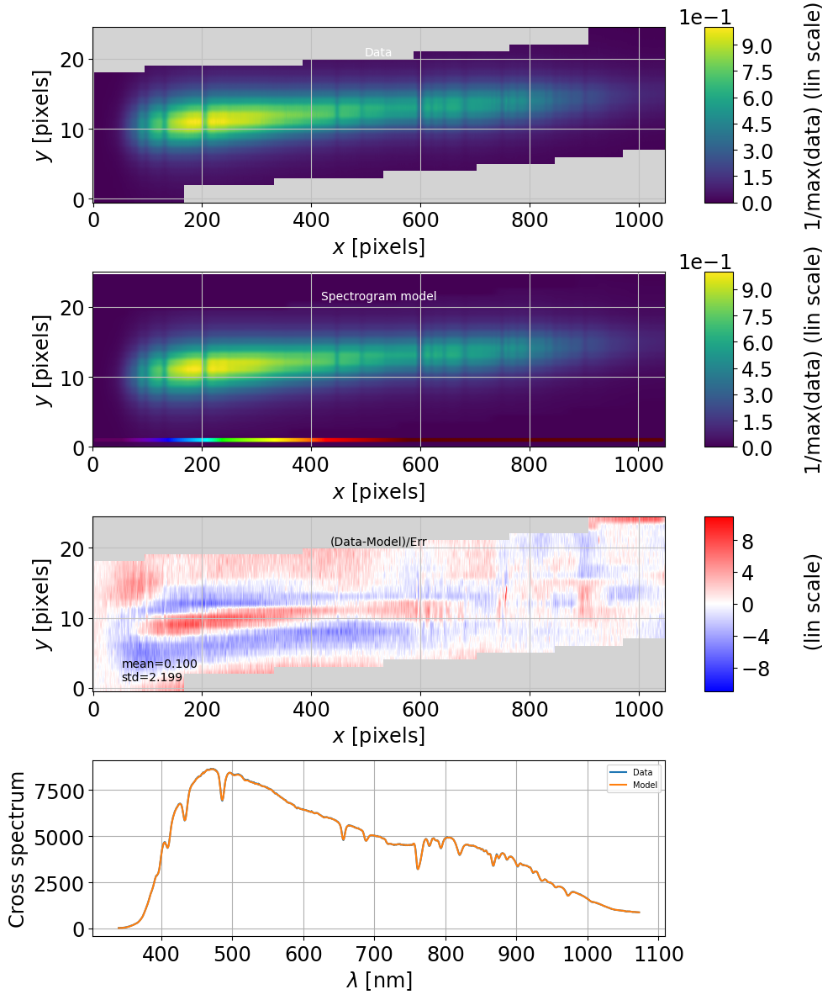

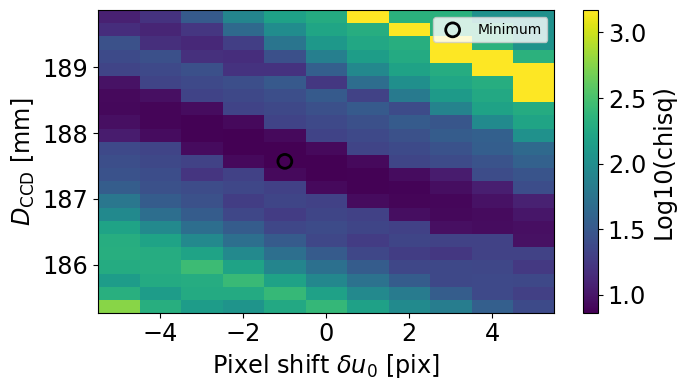

2023-09-21 13:37:12  Spectrum   calibrate_spectrum   INFO   
	Order0 total shift: -0.821pix
	D = 187.636 mm (default: DISTANCE2CCD = 186.00 +/- 0.40 mm, 4.1 sigma shift)


2023-09-21 13:37:12  spectractor.extractor.extractor SpectractorRun       INFO   
	  ======================= SAVE SPECTRUM =============================


spectrum.py::save_spectrum : Can't handle False type <class 'bool'>.
spectrum.py::save_spectrum : Can't handle False type <class 'bool'>.


2023-09-21 13:37:12  Spectrum   save_spectrum        INFO   
	Spectrum saved in ./outputs_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/exposure_2023091400215_flatten_v4_spectrum.fits


    Line    Tabulated  Detected ...   Chisq    Eqwidth_mod Eqwidth_data
                nm        nm    ...                 nm          nm     
----------- --------- --------- ... ---------- ----------- ------------
  $Ca_{II}$   393.366 389.31116 ...   5.748749  0.28891423   0.31199217
  $Ca_{II}$   396.847 396.01517 ...   5.748749  0.62675273    1.0329151
$H\epsilon$     397.0  397.6154 ...   5.748749  0.38312757   0.97128975
  $H\delta$     410.2  410.0402 ...   5.748749   1.7651697    2.8632028
   $Fe_{I}$    430.79  422.3993 ...   5.748749   2.4472938   11.0310755
  $H\gamma$     434.0 433.45312 ...   5.748749   1.0674163    5.1845775
   $Fe_{I}$   438.355 436.17783 ...   5.748749    3.215541    10.239509
   $He_{I}$     447.1   449.248 ...   5.748749   2.3483882   -2.4127345
   $H\beta$     486.3 485.90808 ...  1.7474226   1.3054839    1.3142073
   $Mg_{I}$    517.27 516.83234 ...  1.7474226 0.078074455   0.18476029
   $Fe_{I}$   527.039 526.94543 ...  1.7474226  0.30584687  0.05

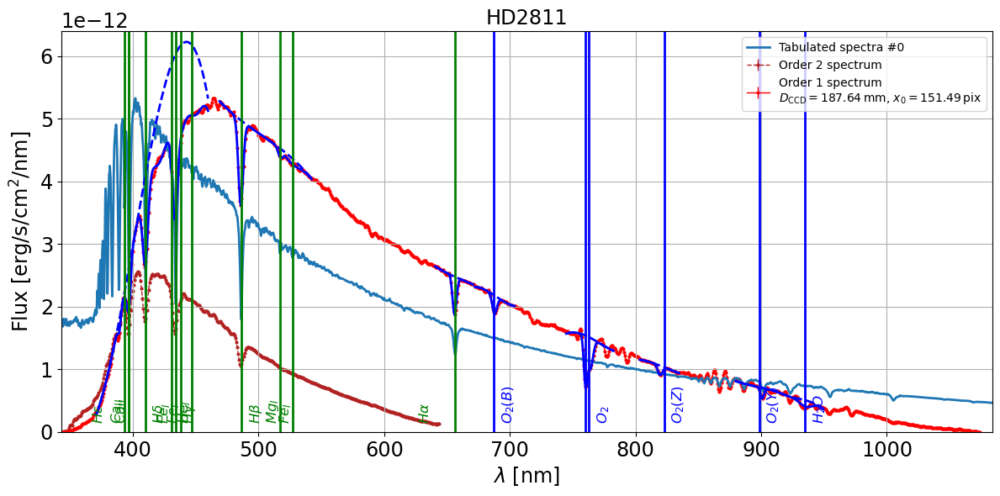

In [93]:
%matplotlib inline
if FLAG_RUNWITHEXCEPTIONS:
    try:
        spectrum = Spectractor(filename, output_directory, guess=[x1,y1], target_label=target_name_sel, disperser_label=disperser_label, config=config)
    except:
        errtype = sys.exc_info()[0]  # E.g. <class 'PermissionError'>
        description = sys.exc_info()[1]   # E.g. [Errno 13] Permission denied: ...
        
        print("\t +++++++++++++++++++++ Exception occured +++++++++++++++++++++++++++++++++++++++++")
        print(f"\t >>>>>  errtype = {errtype}")
        print(f"\t >>>>>> description = {description}")
else:
    spectrum = Spectractor(filename, output_directory, guess=[x1,y1], target_label=target_name_sel, disperser_label=disperser_label, config=config)

    Line    Tabulated  Detected ...   Chisq    Eqwidth_mod Eqwidth_data
                nm        nm    ...                 nm          nm     
----------- --------- --------- ... ---------- ----------- ------------
  $Ca_{II}$   393.366 389.31116 ...   5.748749  0.28891423   0.31199217
  $Ca_{II}$   396.847 396.01517 ...   5.748749  0.62675273    1.0329151
$H\epsilon$     397.0  397.6154 ...   5.748749  0.38312757   0.97128975
  $H\delta$     410.2  410.0402 ...   5.748749   1.7651697    2.8632028
   $Fe_{I}$    430.79  422.3993 ...   5.748749   2.4472938   11.0310755
  $H\gamma$     434.0 433.45312 ...   5.748749   1.0674163    5.1845775
   $Fe_{I}$   438.355 436.17783 ...   5.748749    3.215541    10.239509
   $He_{I}$     447.1   449.248 ...   5.748749   2.3483882   -2.4127345
   $H\beta$     486.3 485.90808 ...  1.7474226   1.3054839    1.3142073
   $Mg_{I}$    517.27 516.83234 ...  1.7474226 0.078074455   0.18476029
   $Fe_{I}$   527.039 526.94543 ...  1.7474226  0.30584687  0.05

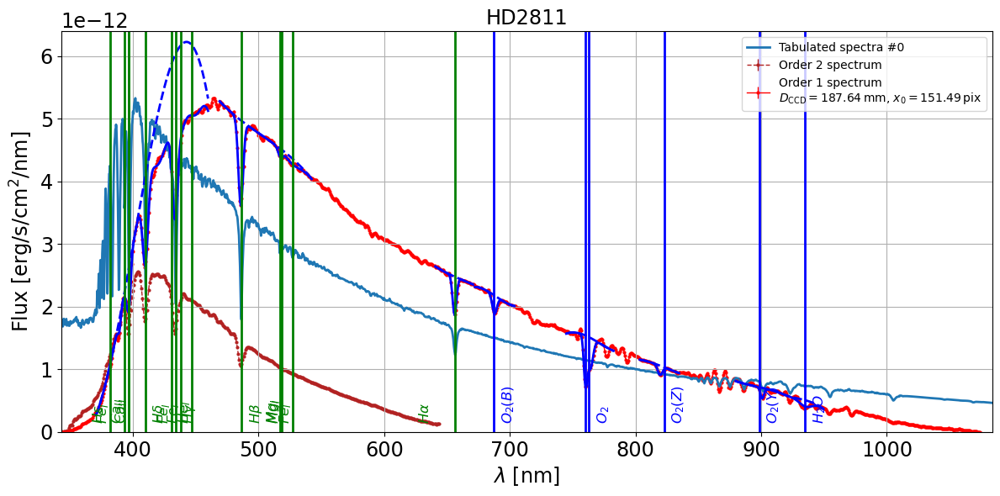

In [94]:
%matplotlib inline
from matplotlib.backends.backend_pdf import PdfPages

fig = plt.figure(figsize=[12, 6])
ax = plt.gca()
spectrum.plot_spectrum(ax=ax,force_lines=True) 
all_figs = [fig]
# gerate a multipage pdf:
multipage_pdf_file = f"spectrum_final_{target}_{DATE}_{the_num}_{configdir}.pdf"
fullfn_multipage_pdf_file = os.path.join(output_figures,multipage_pdf_file)
with PdfPages(fullfn_multipage_pdf_file) as pdf:
    for the_fig in all_figs:
        pdf.savefig(fig)
        plt.close()


# Backup output

- If no crash occurs, arrive here

./outputs_process_holo_config_DECONVOLUTION_PSF2D

In [95]:
def cleandir(path):
    if os.path.isdir(path):
        files=os.listdir(path)
        if len(files) > 0:
            for f in files:
                if os.path.isdir(os.path.join(path,f)):
                    if f==".ipynb_checkpoints":
                        shutil.rmtree(os.path.join(path,f))
                    else:
                        print(" Cannot remove this directory {}".format(os.path.join(path,f)))
                else:
                    os.remove(os.path.join(path,f))

In [96]:
# this flag must be set if one want to clean results from previous runs
if FLAG_MANAGE_OUTPUT_SPECTRACTOR:
    
    # manage global output directory of spectractor
    # Basically it has the name of the input file image
    
    if not os.path.isdir(path_toptoptopoutput_spectractor):
        os.mkdir(path_toptoptopoutput_spectractor)
    
    if not os.path.isdir(path_toptopoutput_spectractor):
        os.mkdir(path_toptopoutput_spectractor) 
        
    if configdir !="":
    # top directory    
        if not os.path.isdir(path_topoutput_spectractor):
            os.mkdir(path_topoutput_spectractor)   
            
            
        if not os.path.isdir(path_output_spectractor):
            os.mkdir(path_output_spectractor)
  
    
    if not os.path.isdir(finalpath_output_spectractor):
        os.mkdir(finalpath_output_spectractor)
        os.mkdir(os.path.join(finalpath_output_spectractor,"basespec"))
        os.mkdir(os.path.join(finalpath_output_spectractor,"plots"))
    else:
        cleandir(os.path.join(finalpath_output_spectractor,"basespec"))
        cleandir(os.path.join(finalpath_output_spectractor,"plots"))

In [97]:
print("******************************** SUCCESS ********************************************")

******************************** SUCCESS ********************************************


In [98]:
copy_tree(output_directory,os.path.join(finalpath_output_spectractor,"basespec"))

2023-09-21 13:37:14  root       copy_file            INFO   copying ./outputs_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/exposure_2023091400215_flatten_v4_spectrum.fits -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/basespec


['/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/basespec/exposure_2023091400215_flatten_v4_spectrum.fits']

In [99]:
copy_tree(output_figures,os.path.join(finalpath_output_spectractor,"plots"))

2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/D2CCD_x0_fit.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/HD2811_spectrum.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/spectrum_final_HD2811_20230914_215_config_DECONVOLUTION_FFMv_REBIN2_Janv2023.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/background_extraction.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/fit_chromatic_psf_best_fit_noprior.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/rotated_image.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/fwhm_2.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/amplitude_correlation_matrix.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/fwhm.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/regularisation.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/intermediate_spectrum.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/order0_centroid_fit.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/image.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/ffm_bestfit_2.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


2023-09-21 13:37:14  root       copy_file            INFO   copying ./figures_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28/parameters_correlation.pdf -> /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots


['/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots/D2CCD_x0_fit.pdf',
 '/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots/HD2811_spectrum.pdf',
 '/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots/spectrum_final_HD2811_20230914_215_config_DECONVOLUTION_FFMv_REBIN2_Janv2023.pdf',
 '/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215/plots/background_extraction.pdf',
 '/home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/2023091

In [100]:
print("finalpath_output_spectractor = ",finalpath_output_spectractor)

finalpath_output_spectractor =  /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023/20230914/2023091400215


In [101]:
os.listdir(os.path.join(finalpath_output_spectractor,"basespec"))

['exposure_2023091400215_flatten_v4_spectrum.fits']

In [102]:
os.listdir(os.path.join(finalpath_output_spectractor,"plots"))

['spectrum_final_HD2811_20230914_215_config_DECONVOLUTION_FFMv_REBIN2_Janv2023.pdf',
 'order0_centroid_fit.pdf',
 'ffm_bestfit.pdf',
 'intermediate_spectrum.pdf',
 'ffm_bestfit_2.pdf',
 'amplitude_correlation_matrix.pdf',
 'fit_chromatic_psf_best_fit_noprior.pdf',
 'fwhm.pdf',
 'background_extraction.pdf',
 'regularisation.pdf',
 'rotated_image.pdf',
 'parameters_correlation.pdf',
 'D2CCD_x0_fit.pdf',
 'fwhm_2.pdf',
 'HD2811_spectrum.pdf',
 'image.pdf']

In [103]:
output_directory

'./outputs_process_20230914_collimator~holo4_003_config_DECONVOLUTION_FFMv_REBIN2_Janv2023_nb_28'

In [104]:
! ls /home/d/dagoret/rubin-user/DATA/AuxtelData2023/OutputSpectractor/myflatfielding/collimator~holo4_003/config_DECONVOLUTION_FFMv_REBIN2_Janv2023


20230914
